In [ ]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =============================================================================
# Configuration
# =============================================================================

BASE_DIR = Path.cwd().parents[1]

PARQUET_DIR = BASE_DIR / "processing" / "parquet_aligned"

files = sorted(PARQUET_DIR.glob("*.parquet"))

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)

In [ ]:
# =============================================================================
# Dataset Overview
# =============================================================================

overview = []

for file in files:

    device = file.stem.upper()

    df = pd.read_parquet(file)

    overview.append({

        "Device": device,

        "Rows": len(df),

        "Columns": len(df.columns),

        "Start": df.index.min(),

        "End": df.index.max(),

        "Memory (MB)": round(
            df.memory_usage(deep=True).sum() / 1024**2,
            2
        )

    })

overview = pd.DataFrame(overview)

display(overview)


,Device,Rows,Columns,Start,End,Memory (MB)
0,ADB,1570251,56,2018-08-09 15:49:22,2022-04-12 15:48:05,682.86
1,CRAC1,1570230,56,2018-08-09 15:49:22,2022-04-12 15:53:05,682.85
2,CRAC2,1570716,56,2018-08-09 15:49:22,2022-04-12 23:59:05,683.07
3,CRAC3,1570202,56,2018-08-09 15:49:22,2022-04-12 15:27:05,682.84
4,CRAC4,1570221,56,2018-08-09 15:49:22,2022-04-12 15:52:05,682.85
5,CRAC5,1570707,56,2018-08-09 15:49:22,2022-04-12 23:59:05,683.06
6,CRAC6,1570707,56,2018-08-09 15:49:22,2022-04-12 23:59:05,683.06
7,IUDB,1570220,56,2018-08-09 15:49:22,2022-04-12 15:43:05,682.85
8,NDB,1570241,56,2018-08-09 15:49:22,2022-04-12 15:53:05,682.86
9,UDB1,1570724,56,2018-08-09 15:49:22,2022-04-12 23:59:05,683.07


In [ ]:
# =============================================================================
# Metric Quality Summary
# =============================================================================

EXTREME_LOWER_PERCENTILE = 0.01
EXTREME_UPPER_PERCENTILE = 99.99

all_summary = []

for file in files:

    device = file.stem.upper()

    df = pd.read_parquet(file)

    summary = []

    for column in df.columns:

        s = df[column]

        if pd.api.types.is_numeric_dtype(s):

            s_nonan = s.dropna()

            if len(s_nonan) > 0:

                lower = s_nonan.quantile(
                    EXTREME_LOWER_PERCENTILE / 100
                )

                upper = s_nonan.quantile(
                    EXTREME_UPPER_PERCENTILE / 100
                )

                extreme_mask = (
                    (s_nonan < lower) |
                    (s_nonan > upper)
                )

                n_extreme = int(extreme_mask.sum())

            else:

                lower = np.nan
                upper = np.nan
                n_extreme = 0

            summary.append({

                "Device": device,

                "Metric": column,

                "Dtype": str(s.dtype),

                "Count": s.count(),

                "NaNs": s.isna().sum(),

                "NaN (%)": round(
                    100 * s.isna().sum() / len(s),
                    4
                ),

                "Zeros": (s == 0).sum(),

                "Negatives": (s < 0).sum(),

                "Unique": s.nunique(dropna=True),

                "Constant": s.nunique(dropna=True) == 1,

                "Mean": s.mean(),

                "Std": s.std(),

                "Min": s.min(),

                "25%": s.quantile(0.25),

                "Median": s.median(),

                "75%": s.quantile(0.75),

                "Max": s.max(),

                "Extreme Values": n_extreme,

                "Extreme (%)": round(
                    100 * n_extreme / len(s_nonan),
                    5
                ) if len(s_nonan) > 0 else np.nan,

                "Lower Extreme Limit": lower,

                "Upper Extreme Limit": upper

            })

        else:

            summary.append({

                "Device": device,

                "Metric": column,

                "Dtype": str(s.dtype),

                "Count": s.count(),

                "NaNs": s.isna().sum(),

                "NaN (%)": round(
                    100 * s.isna().sum() / len(s),
                    4
                ),

                "Zeros": np.nan,

                "Negatives": np.nan,

                "Unique": s.nunique(dropna=True),

                "Constant": s.nunique(dropna=True) == 1,

                "Mean": np.nan,

                "Std": np.nan,

                "Min": np.nan,

                "25%": np.nan,

                "Median": np.nan,

                "75%": np.nan,

                "Max": np.nan,

                "Extreme Values": np.nan,

                "Extreme (%)": np.nan,

                "Lower Extreme Limit": np.nan,

                "Upper Extreme Limit": np.nan

            })

    summary = pd.DataFrame(summary)
    all_summary.append(summary)

all_summary = pd.concat(
    all_summary,
    ignore_index=True
)


print("Data quality audit reports saved.")

Data quality audit reports saved.


## investigate rare negatives and zeros present:

In [4]:
# =============================================================================
# Investigate Rare Zero and Negative Values
# =============================================================================

MAX_RARE_EVENTS = 100  # Only inspect metrics with <= this many anomalies

investigation = []

for file in files:

    device = file.stem.upper()

    print("=" * 80)
    print(device)
    print("=" * 80)

    df = pd.read_parquet(file)

    for column in df.columns:

        s = df[column]

        if not pd.api.types.is_numeric_dtype(s):
            continue

        # ---------------------------------------------------------------------
        # Zero values
        # ---------------------------------------------------------------------

        zero_idx = s[s == 0].index

        if 0 < len(zero_idx) <= MAX_RARE_EVENTS:

            print(f"\n[ZERO] {column} ({len(zero_idx)} occurrences)")

            for ts in zero_idx:

                loc = s.index.get_loc(ts)

                start = max(0, loc - 2)
                end = min(len(s), loc + 3)

                context = pd.DataFrame({
                    "Timestamp": s.index[start:end],
                    "Value": s.iloc[start:end].values
                })

                print("\nContext:")
                print(context)

                investigation.append({

                    "Device": device,
                    "Metric": column,
                    "Type": "Zero",
                    "Timestamp": ts,
                    "Value": s.loc[ts]

                })

        # ---------------------------------------------------------------------
        # Negative values
        # ---------------------------------------------------------------------

        neg_idx = s[s < 0].index

        if 0 < len(neg_idx) <= MAX_RARE_EVENTS:

            print(f"\n[NEGATIVE] {column} ({len(neg_idx)} occurrences)")

            for ts in neg_idx:

                loc = s.index.get_loc(ts)

                start = max(0, loc - 2)
                end = min(len(s), loc + 3)

                context = pd.DataFrame({
                    "Timestamp": s.index[start:end],
                    "Value": s.iloc[start:end].values
                })

                print("\nContext:")
                print(context)

                investigation.append({

                    "Device": device,
                    "Metric": column,
                    "Type": "Negative",
                    "Timestamp": ts,
                    "Value": s.loc[ts]

                })

# =============================================================================
# Save Investigation Report
# =============================================================================

investigation = pd.DataFrame(investigation)


ADB

[ZERO] L1PhaseVoltage_Vx10 (13 occurrences)

Context:
            Timestamp        Value
0 2018-08-09 15:49:22     0.000000
1 2018-08-09 15:50:22  2265.678223
2 2018-08-09 15:51:22  2272.969727

Context:
            Timestamp        Value
0 2018-08-17 21:26:22  2250.721436
1 2018-08-17 21:27:22  2257.364990
2 2018-08-17 21:38:30     0.000000
3 2018-08-17 21:39:30     0.000000
4 2018-08-17 21:40:30     0.000000

Context:
            Timestamp        Value
0 2018-08-17 21:27:22  2257.364990
1 2018-08-17 21:38:30     0.000000
2 2018-08-17 21:39:30     0.000000
3 2018-08-17 21:40:30     0.000000
4 2018-08-17 21:41:30  2252.026611

Context:
            Timestamp        Value
0 2018-08-17 21:38:30     0.000000
1 2018-08-17 21:39:30     0.000000
2 2018-08-17 21:40:30     0.000000
3 2018-08-17 21:41:30  2252.026611
4 2018-08-17 21:42:30  2252.493408

Context:
            Timestamp        Value
0 2019-02-26 16:15:56  2272.108643
1 2019-02-26 16:16:56  2285.054199
2 2019-03-22 08:57:01     

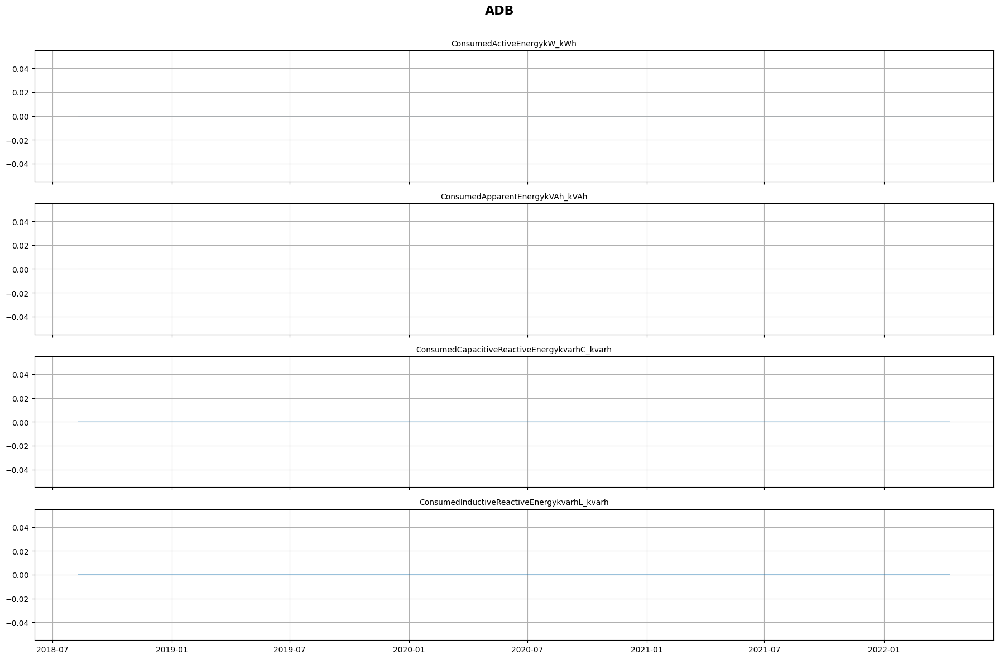

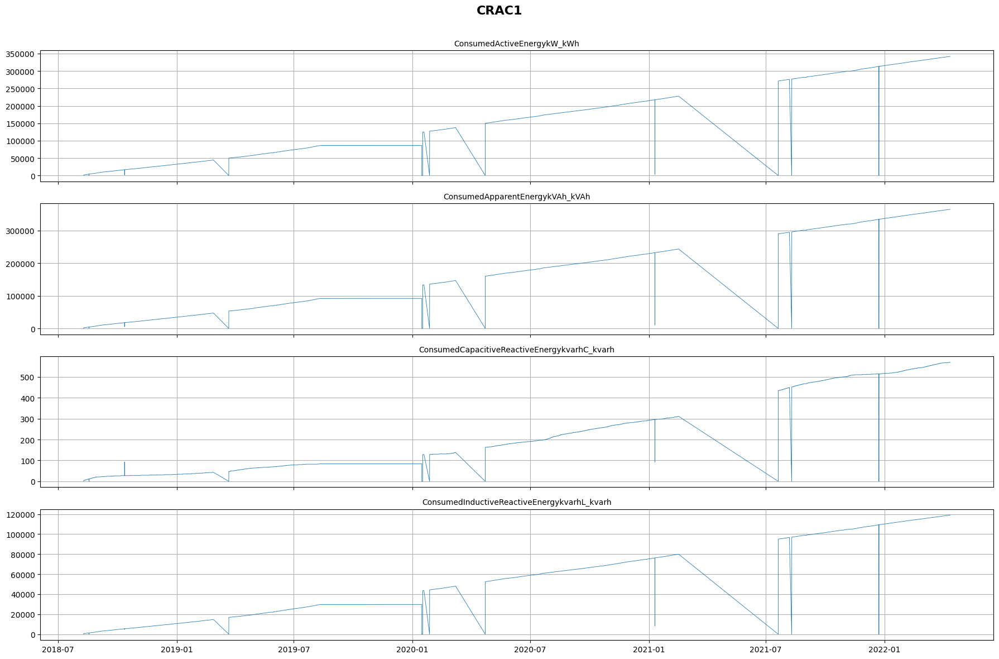

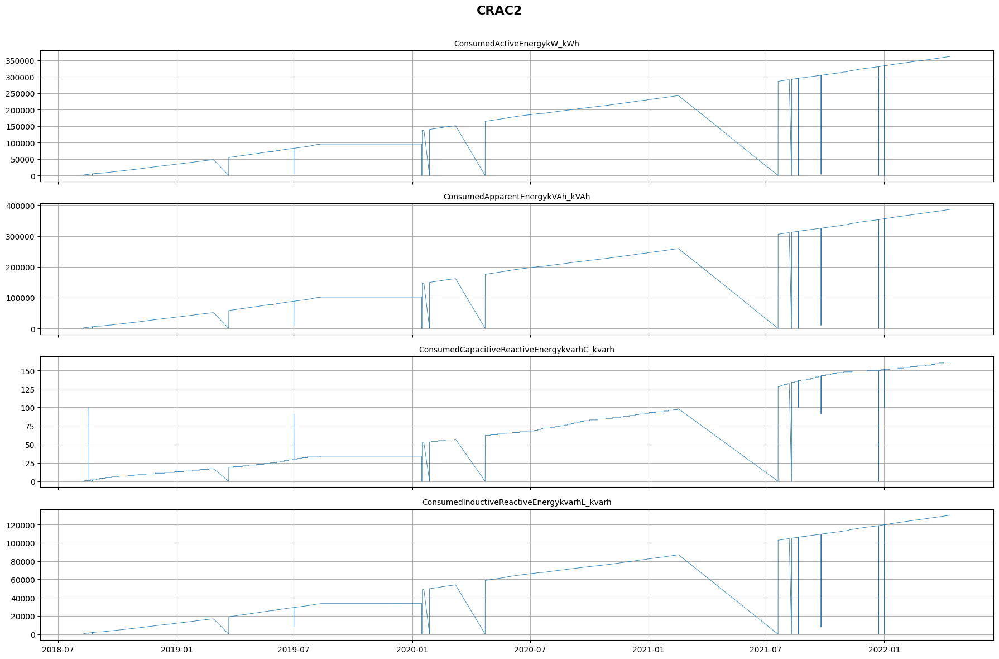

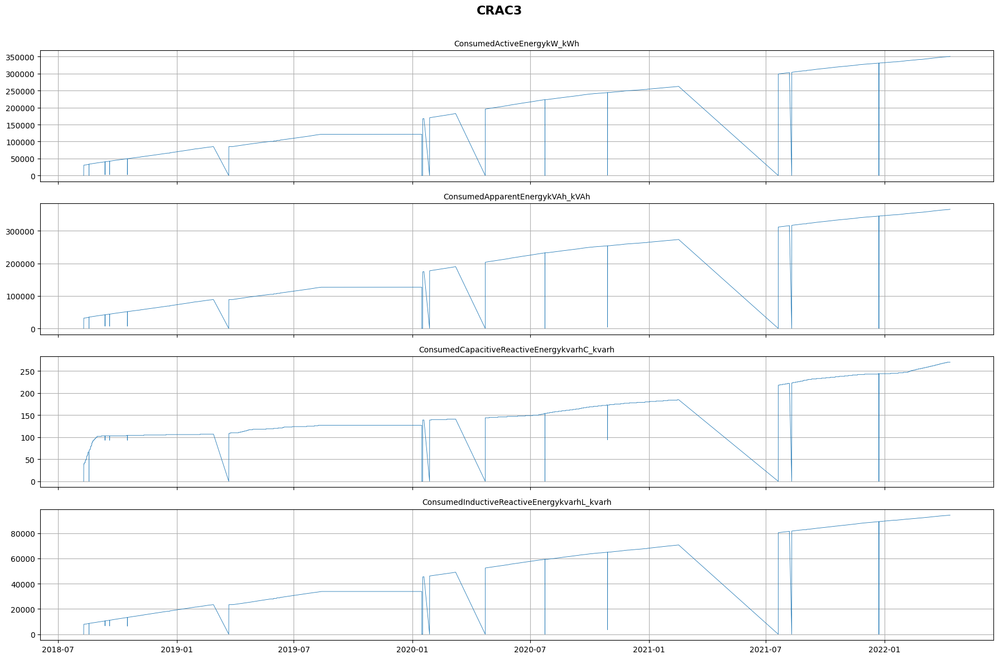

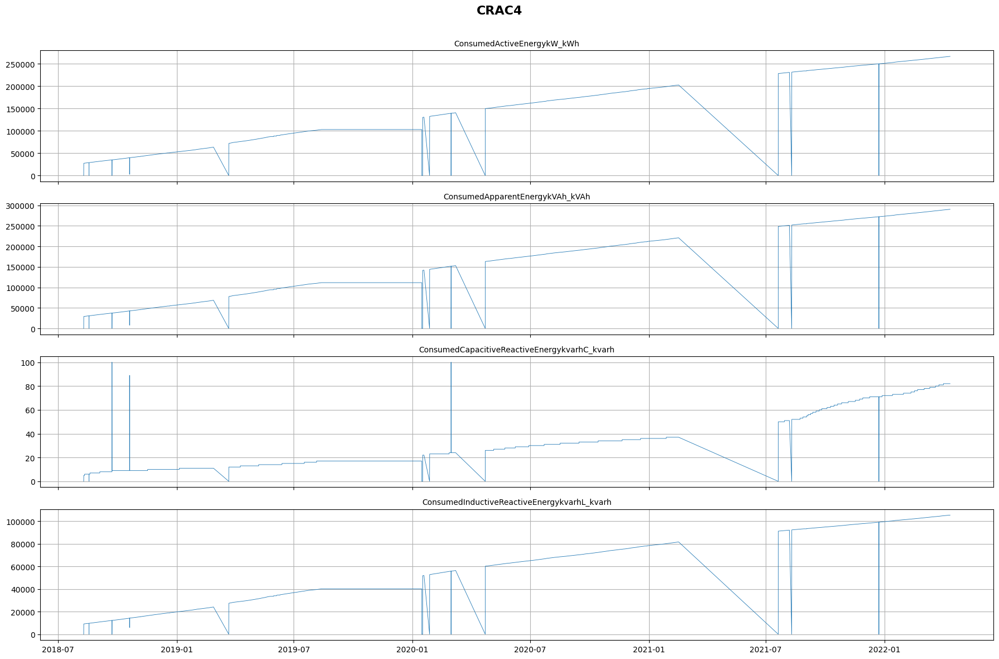

...

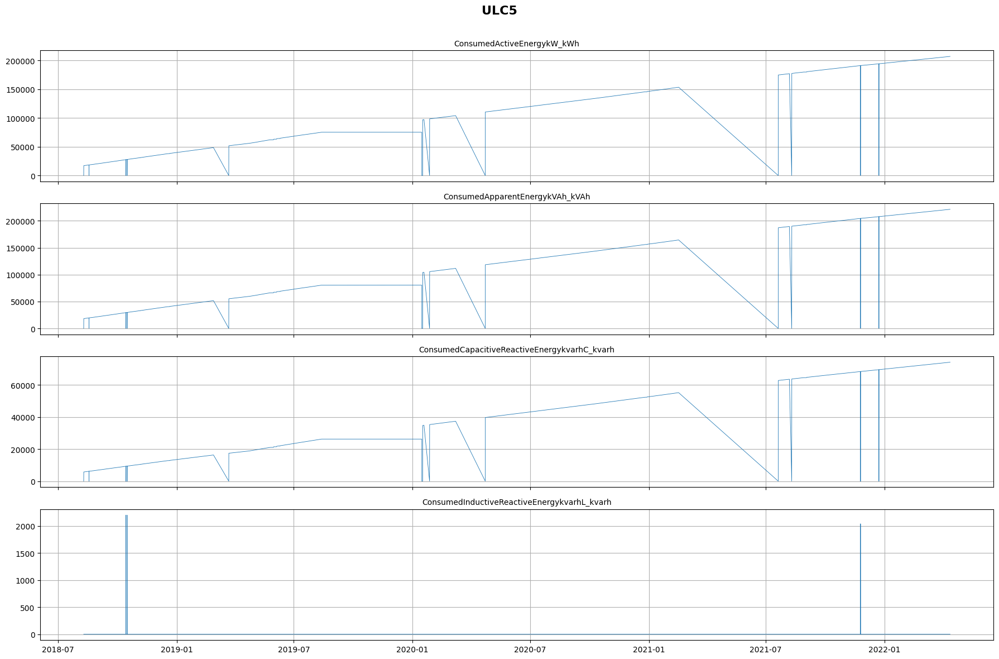

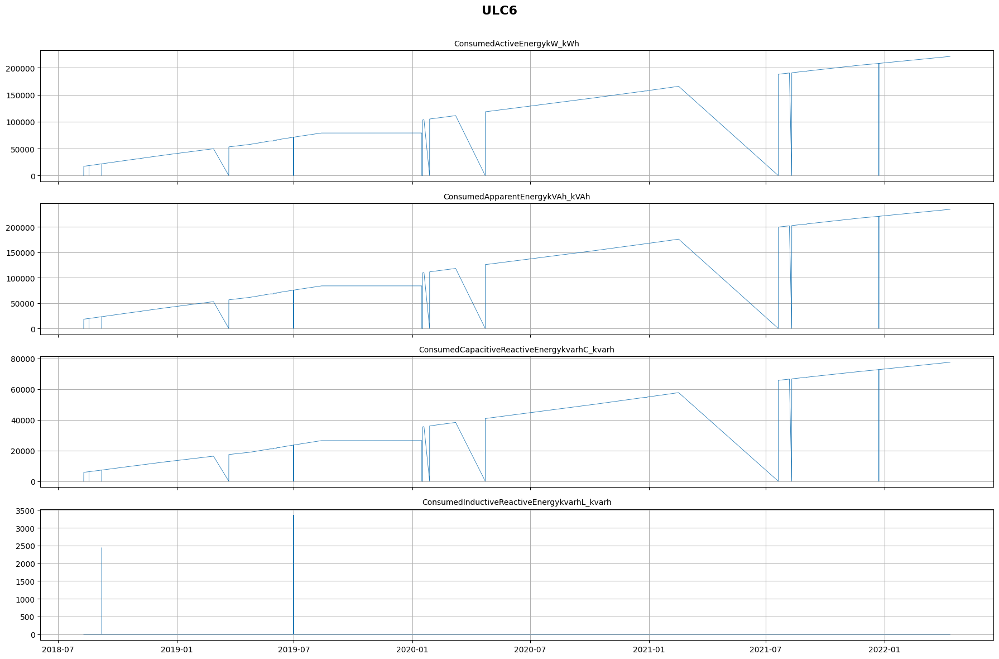

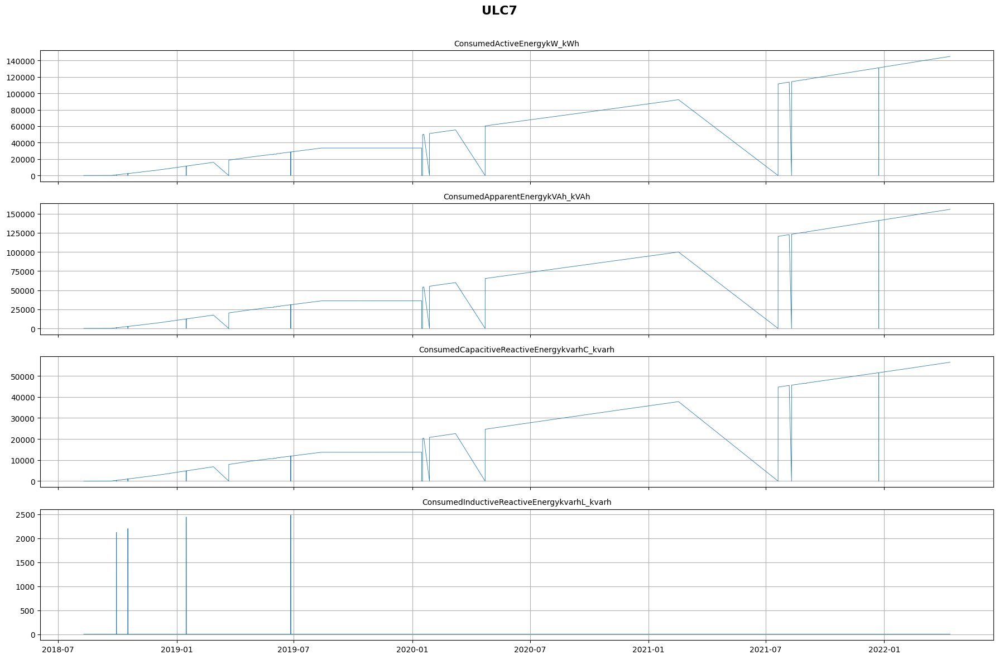

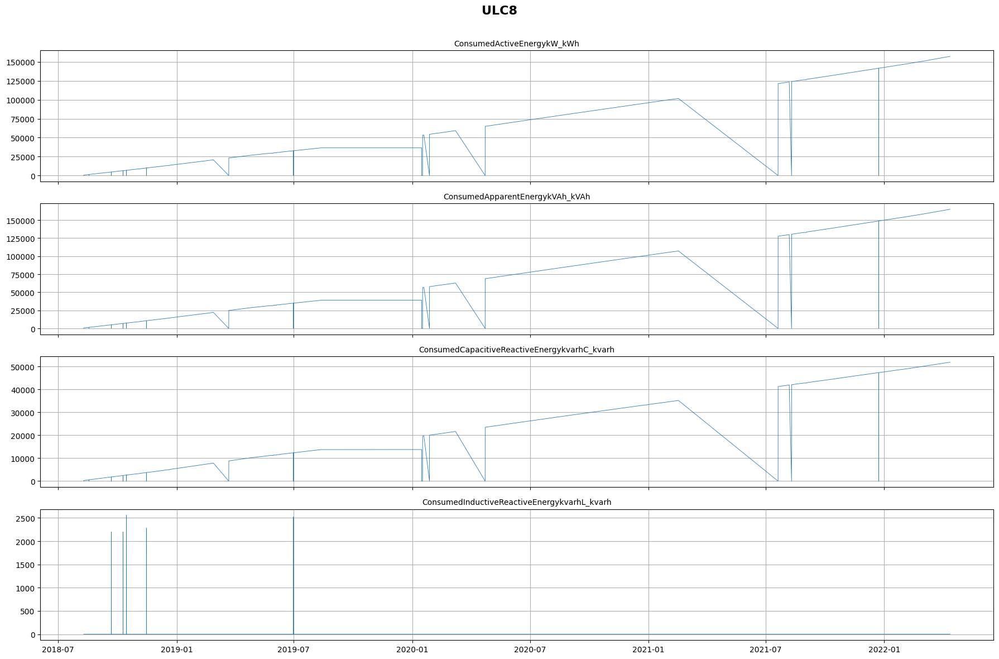

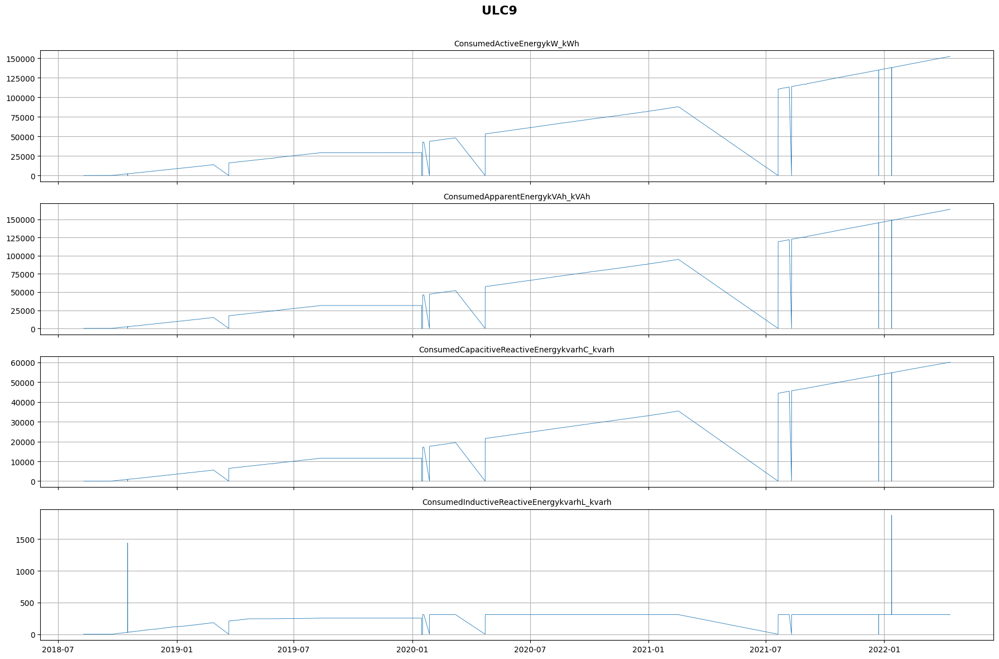

In [16]:
# =============================================================================
# Plot cumulative energy metrics - All datasets
# =============================================================================

CUMULATIVE_METRICS = [
    "ConsumedActiveEnergykW_kWh",
    "ConsumedApparentEnergykVAh_kVAh",
    "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
    "ConsumedInductiveReactiveEnergykvarhL_kvarh",
]

for file in files:

    device = file.stem.upper()

    df = pd.read_parquet(file)

    fig, axes = plt.subplots(
        nrows=len(CUMULATIVE_METRICS),
        ncols=1,
        figsize=(18, 12),
        sharex=True
    )

    fig.suptitle(device, fontsize=16, fontweight="bold")

    for ax, metric in zip(axes, CUMULATIVE_METRICS):

        if metric not in df.columns:
            ax.set_visible(False)
            continue

        ax.plot(
            df.index,
            df[metric],
            linewidth=0.6
        )

        ax.set_title(metric, fontsize=10)
        ax.grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()



In [15]:
print(len(files))
print (files.sort())    

24
None


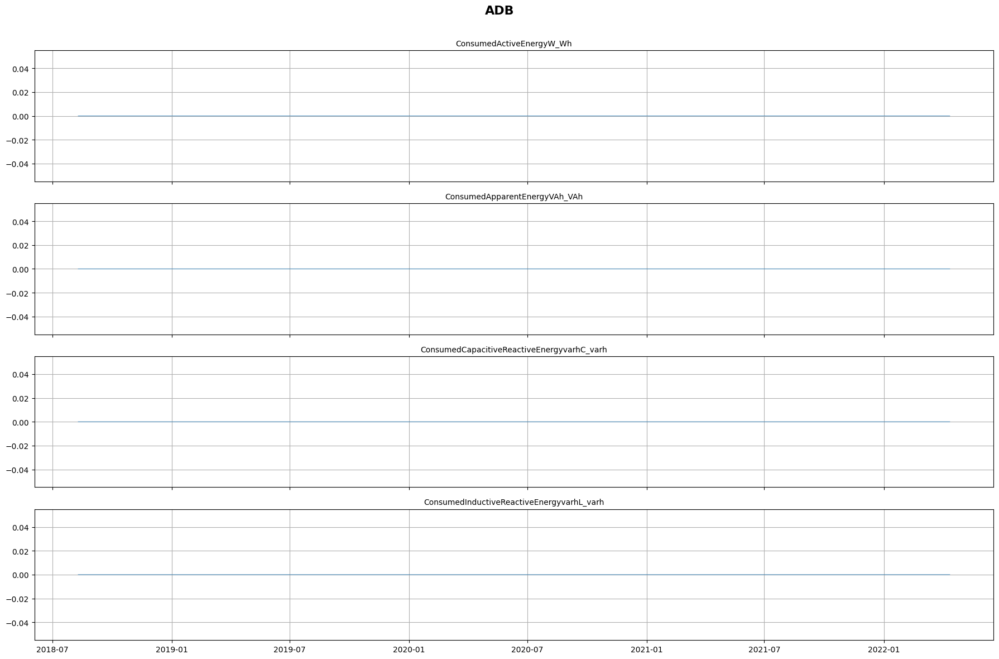

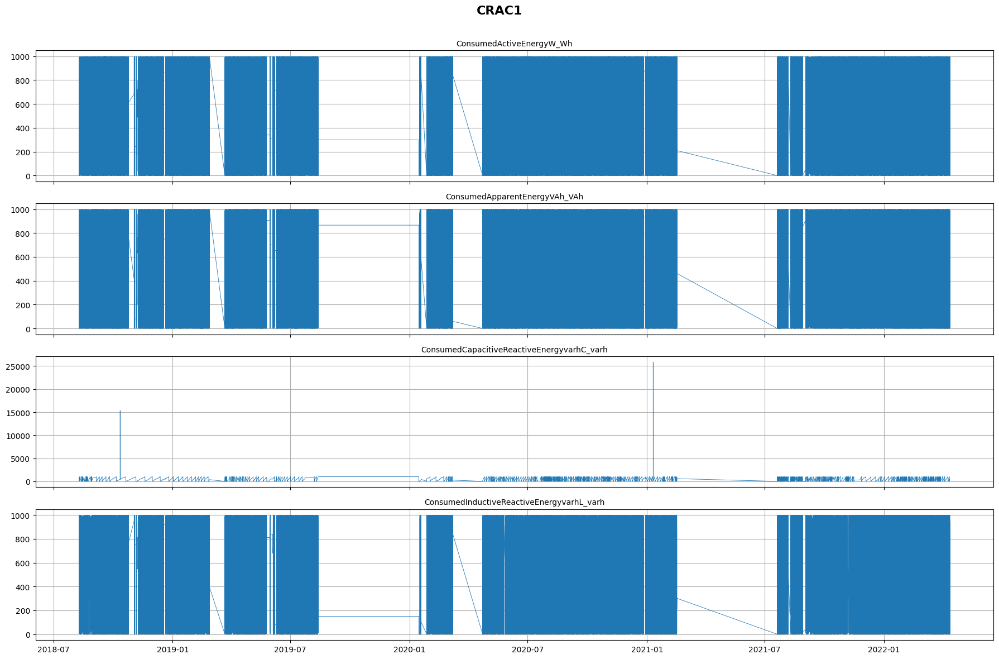

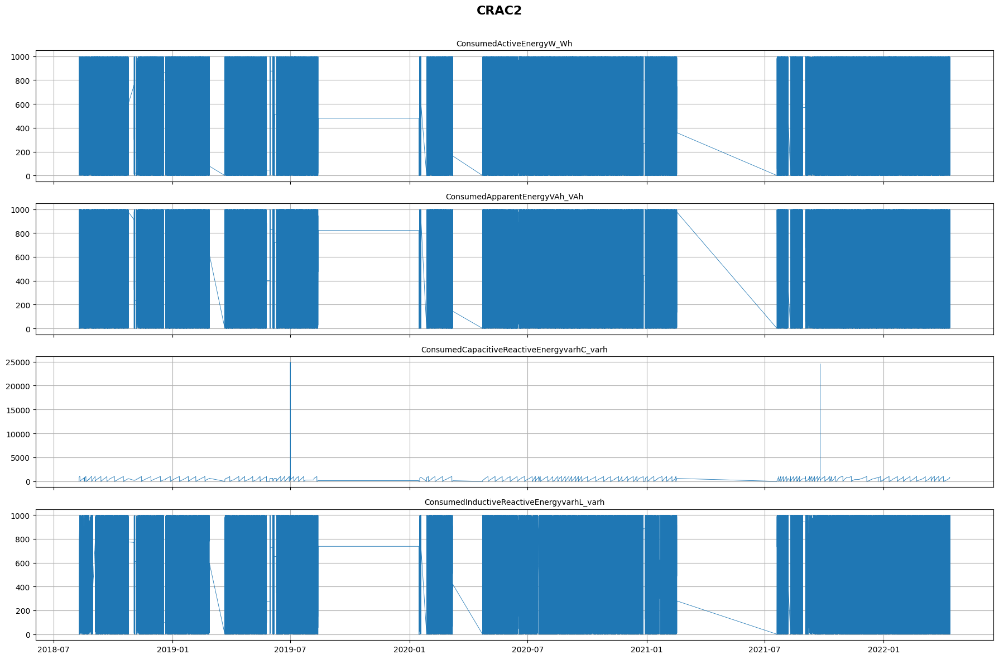

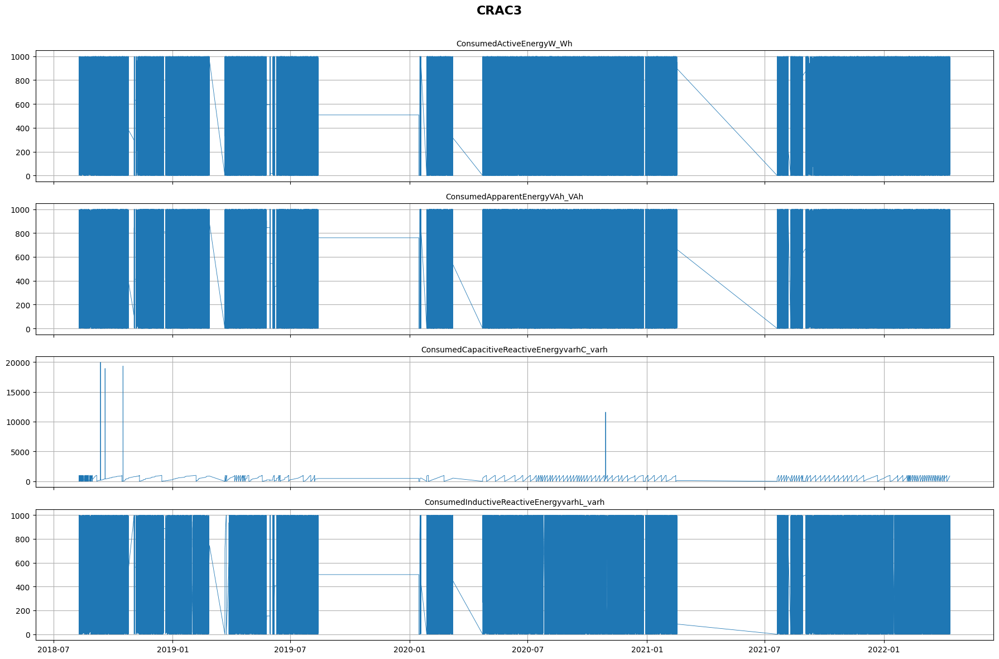

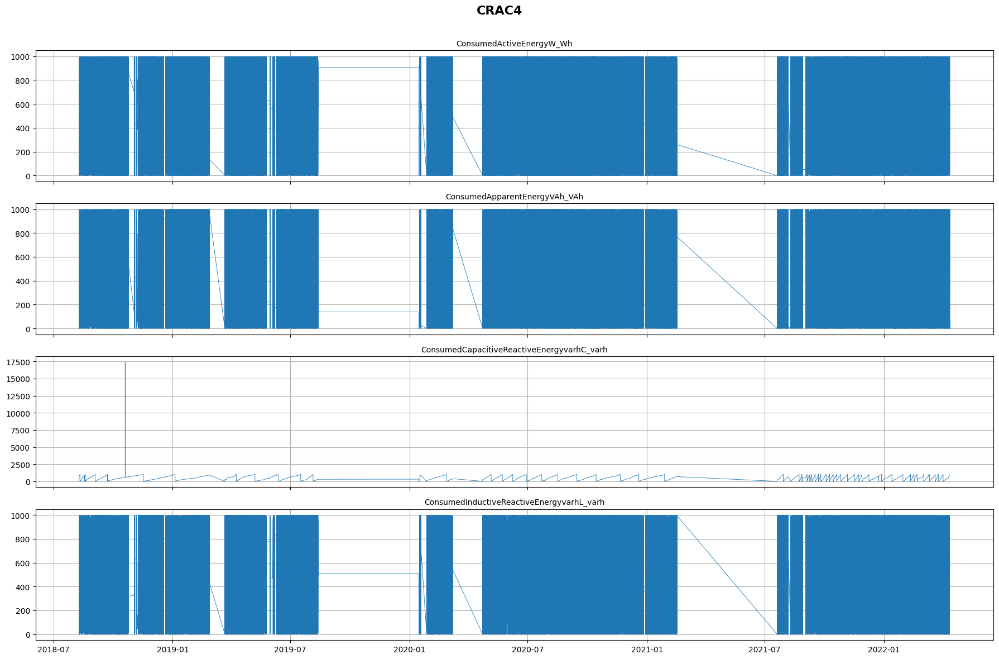

...

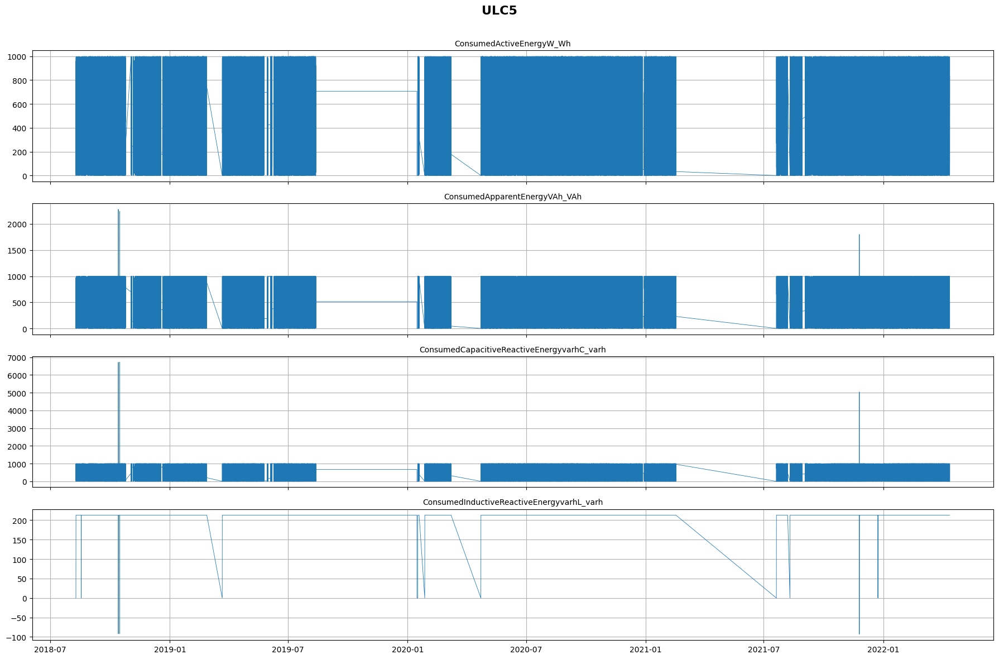

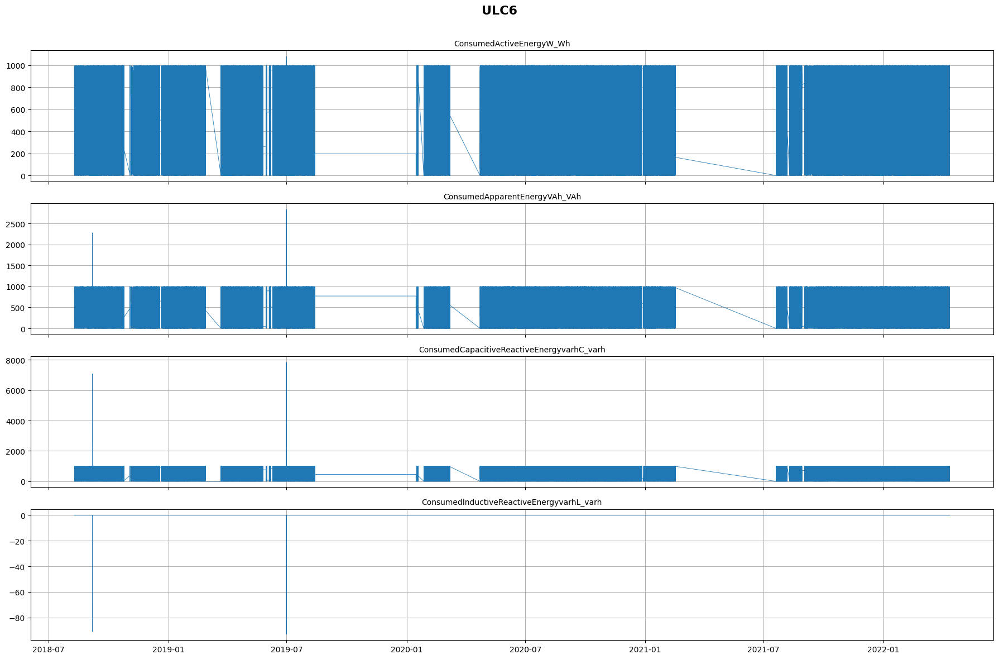

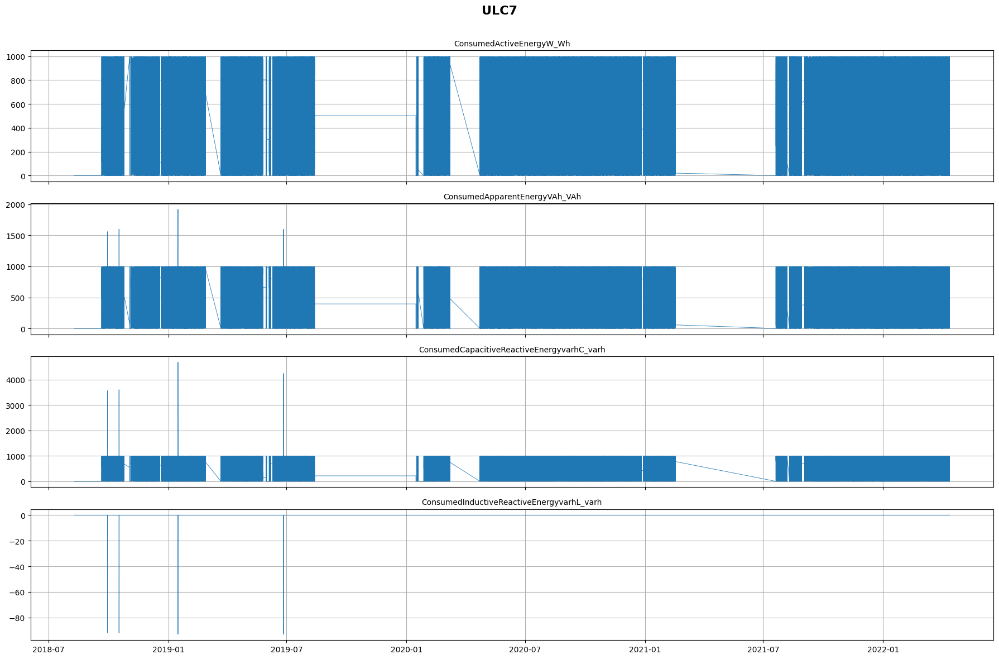

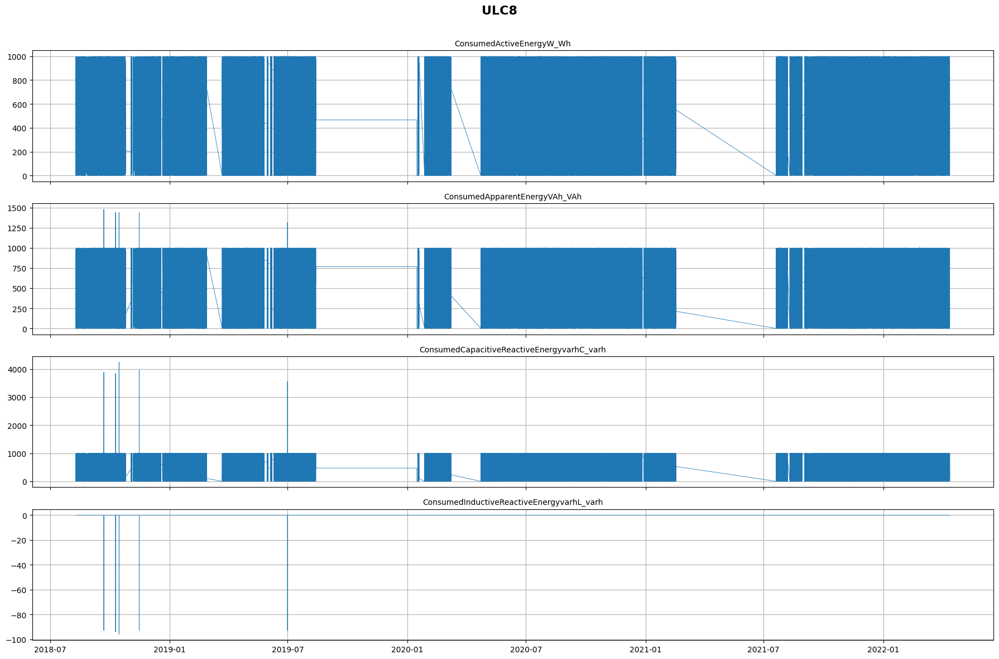

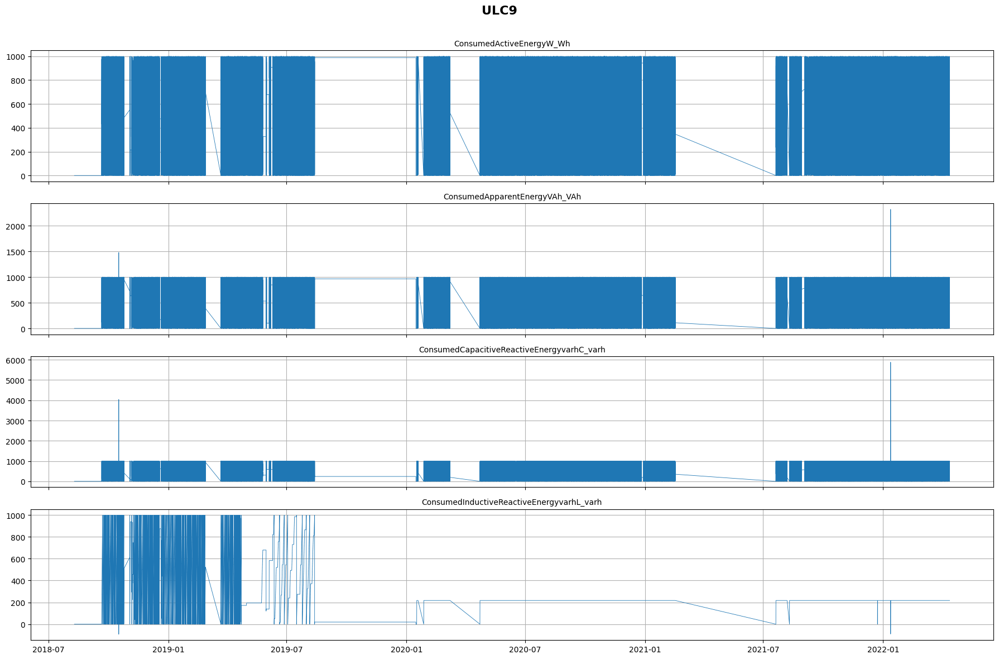

In [17]:
# =============================================================================
# Plot interval energy metrics - All datasets
# =============================================================================

INTERVAL_ENERGY_METRICS = [
    "ConsumedActiveEnergyW_Wh",
    "ConsumedApparentEnergyVAh_VAh",
    "ConsumedCapacitiveReactiveEnergyvarhC_varh",
    "ConsumedInductiveReactiveEnergyvarhL_varh",
]

for file in files:

    device = file.stem.upper()

    df = pd.read_parquet(file)

    fig, axes = plt.subplots(
        nrows=len(INTERVAL_ENERGY_METRICS),
        ncols=1,
        figsize=(18, 12),
        sharex=True
    )

    fig.suptitle(device, fontsize=16, fontweight="bold")

    for ax, metric in zip(axes, INTERVAL_ENERGY_METRICS):

        if metric not in df.columns:
            ax.set_visible(False)
            continue

        ax.plot(
            df.index,
            df[metric],
            linewidth=0.6
        )

        ax.set_title(metric, fontsize=10)
        ax.grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

| Issue           | Finding                                  | Cleaning Rule                                                                               |
| --------------- | ---------------------------------------- | ------------------------------------------------------------------------------------------- |
| Missing values  | None detected                            | No action required                                                                          |
| Zero values     | Rare in some metrics, common in others   | Preserve unless engineering validation identifies invalid measurements                      |
| Negative values | Two populations: isolated and systematic | Preserve systematic negatives; investigate isolated negatives during engineering validation |
| Extreme values  | Identified statistically                 | Preserve; percentile thresholds used for flagging only                                      |
| Meter resets    | Present in cumulative energy registers   | Correct during cleaning                                                                     |


## clean cumulative columns:

In [ ]:
# =============================================================================
# Remove Decreasing Cumulative Counter Rows (Robust Outlier & Loop Safe)
# =============================================================================

from pathlib import Path
import pandas as pd
import numpy as np

# -----------------------------------------------------------------------------
# Directories
# -----------------------------------------------------------------------------

PROCESSING_DIR = Path("..").resolve()

INPUT_DIR = PROCESSING_DIR / "parquet_aligned"
OUTPUT_DIR = PROCESSING_DIR / "parquet_cleaned"

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------------------------------------------------------
# Cumulative Counter Metrics & Devices
# -----------------------------------------------------------------------------

CUMULATIVE_COUNTER_METRICS = [
    "ConsumedActiveEnergykW_kWh",
    "ConsumedApparentEnergykVAh_kVAh",
    "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
    "ConsumedInductiveReactiveEnergykvarhL_kvarh",
]

ACTIVE_COUNTER_DEVICES = {
    "CRAC1", "CRAC2", "CRAC3", "CRAC4", "CRAC5", "CRAC6",
    "ULC1", "ULC2", "ULC3", "ULC4", "ULC5", "ULC6",
    "ULC7", "ULC8", "ULC9", "ULC10", "ULC12"
}

# -----------------------------------------------------------------------------
# Cleaning
# -----------------------------------------------------------------------------

cleaning_log = []

for file in sorted(INPUT_DIR.glob("*.parquet")):

    device = file.stem.upper()
    print(f"\nProcessing {device}...")

    df = pd.read_parquet(file)

    original_rows = len(df)
    rows_removed = 0

    if device in ACTIVE_COUNTER_DEVICES:
        # Max 3 passes prevents infinite cascading loops (like ULC3)
        # while taking care of isolated corrupt readings
        MAX_PASSES = 3
        
        for pass_num in range(1, MAX_PASSES + 1):
            remove_mask = pd.Series(False, index=df.index)

            for metric in CUMULATIVE_COUNTER_METRICS:
                if metric not in df.columns:
                    continue

                # Skip inactive metrics (>99% zeros)
                zero_fraction = (df[metric] == 0).mean()
                if zero_fraction > 0.99:
                    if pass_num == 1:
                        print(f"  Skipping {metric} (>99% zeros)")
                    continue

                # Flag negative step drops (where current value < previous value)
                diff = df[metric].diff()
                
                # Check next value to distinguish single bad spike vs actual reset
                # If next value recovers back up, current row is an anomaly spike
                next_diff = df[metric].diff(-1) # diff relative to next row
                
                # Drop negative drops that are transient anomalies
                remove_mask |= (diff < 0)

            n_to_remove = int(remove_mask.sum())
            print(f"  Pass {pass_num}: {n_to_remove} rows to remove")

            if n_to_remove == 0:
                break

            rows_removed += n_to_remove
            df = df.loc[~remove_mask].copy()

        print(f"  Total rows removed: {rows_removed}")

    output_file = OUTPUT_DIR / file.name

    df.to_parquet(
        output_file,
        index=True,
        compression="snappy"
    )

    cleaning_log.append({
        "Device": device,
        "Original Rows": original_rows,
        "Rows Removed": rows_removed,
        "Rows Remaining": len(df)
    })

cleaning_log = pd.DataFrame(cleaning_log)

display(cleaning_log)

print("\nCleaning complete.")
print(f"Cleaned datasets saved to:\n{OUTPUT_DIR}")


Processing ADB...

Processing CRAC1...
  Pass 1: 11 rows to remove
  Pass 2: 1 rows to remove
  Pass 3: 1 rows to remove
  Total rows removed: 13

Processing CRAC2...
  Pass 1: 16 rows to remove
  Pass 2: 4 rows to remove
  Pass 3: 4 rows to remove
  Total rows removed: 24

Processing CRAC3...
  Pass 1: 13 rows to remove
  Pass 2: 2 rows to remove
  Pass 3: 2 rows to remove
  Total rows removed: 17

Processing CRAC4...
  Pass 1: 14 rows to remove
  Pass 2: 2 rows to remove
  Pass 3: 2 rows to remove
  Total rows removed: 18

Processing CRAC5...
  Pass 1: 17 rows to remove
  Pass 2: 2 rows to remove
  Pass 3: 2 rows to remove
  Total rows removed: 21

Processing CRAC6...
  Pass 1: 12 rows to remove
  Pass 2: 2 rows to remove
  Pass 3: 2 rows to remove
  Total rows removed: 16

Processing IUDB...

Processing NDB...

Processing UDB1...

Processing UDB2...

Processing UDB3...

Processing ULC1...
  Skipping ConsumedInductiveReactiveEnergykvarhL_kvarh (>99% zeros)
  Pass 1: 13 rows to remov

,Device,Original Rows,Rows Removed,Rows Remaining
0,ADB,1570251,0,1570251
1,CRAC1,1570230,13,1570217
2,CRAC2,1570716,24,1570692
3,CRAC3,1570202,17,1570185
4,CRAC4,1570221,18,1570203
5,CRAC5,1570707,21,1570686
6,CRAC6,1570707,16,1570691
7,IUDB,1570220,0,1570220
8,NDB,1570241,0,1570241
9,UDB1,1570724,0,1570724



Cleaning complete.
Cleaned datasets saved to:
C:\Users\35387\OneDrive\Desktop\Publishing\energy-data\energydata-master\energydata-master\processing\parquet_cleaned


Generating plot for ADB...


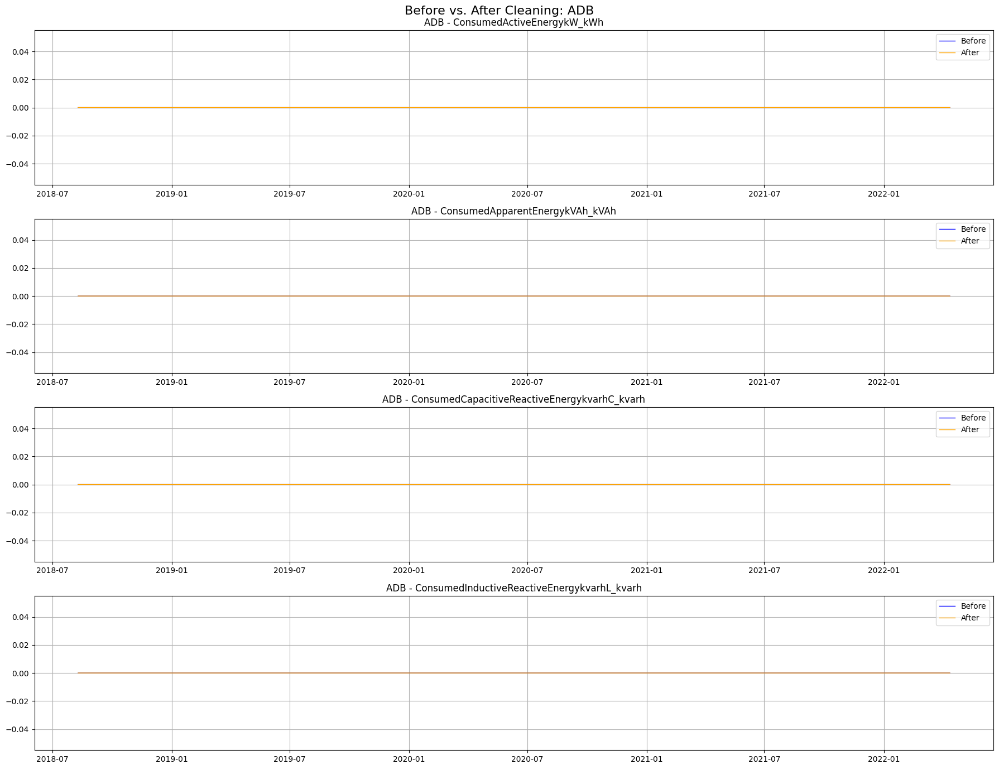

Generating plot for CRAC1...


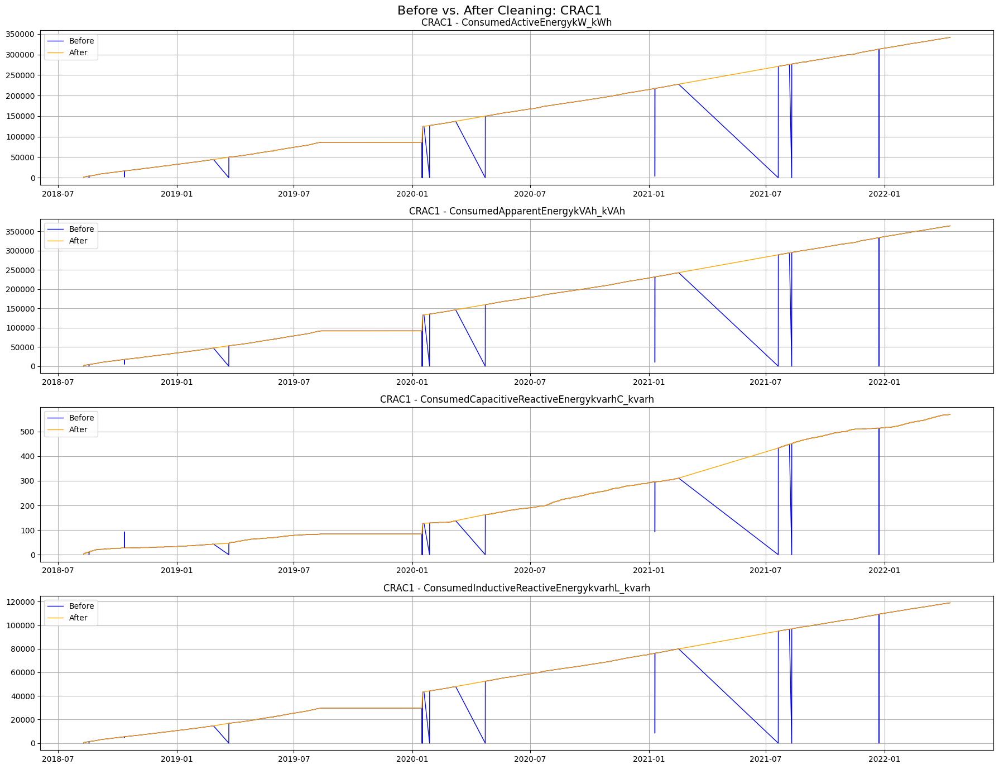

Generating plot for CRAC2...


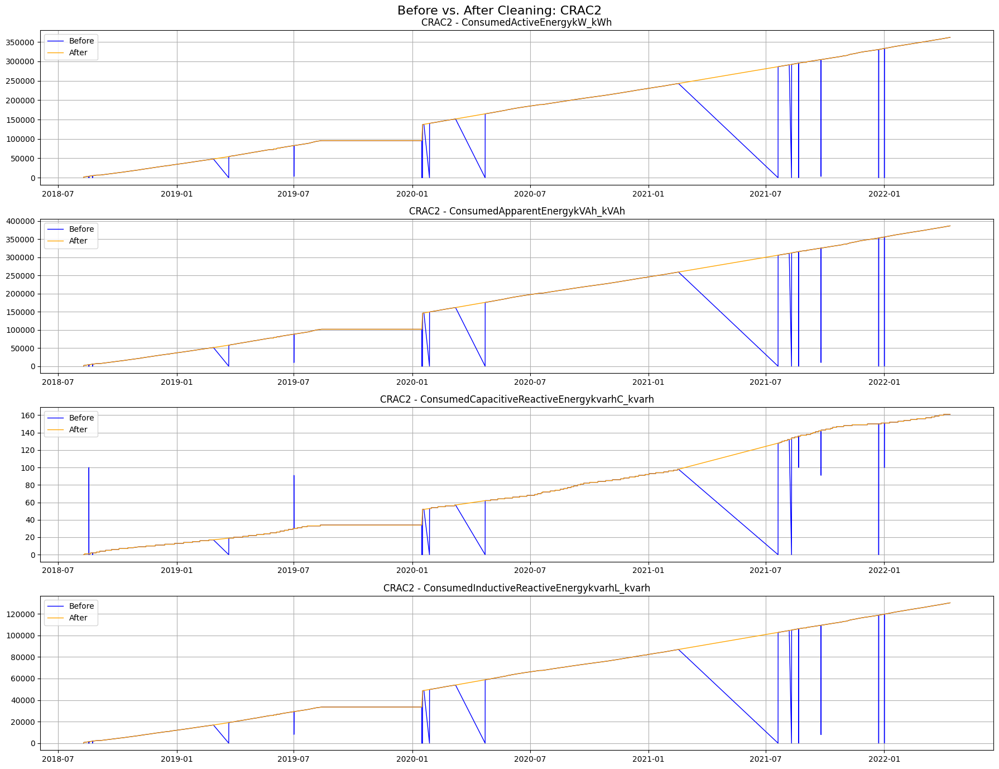

Generating plot for CRAC3...


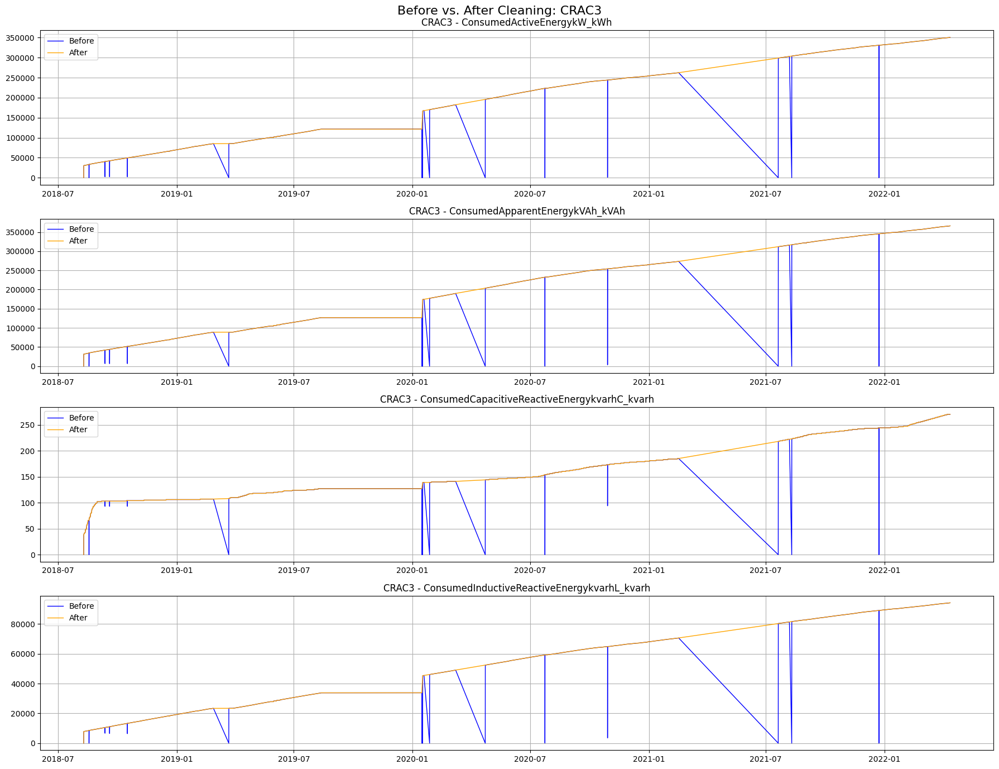

Generating plot for CRAC4...


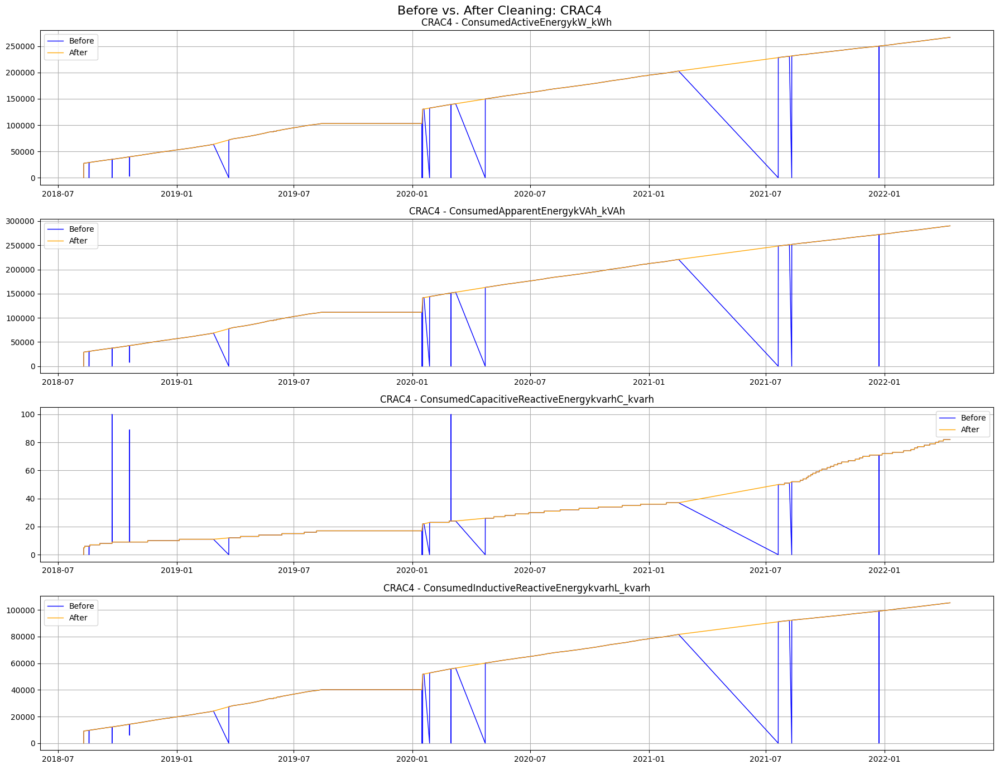

Generating plot for CRAC5...


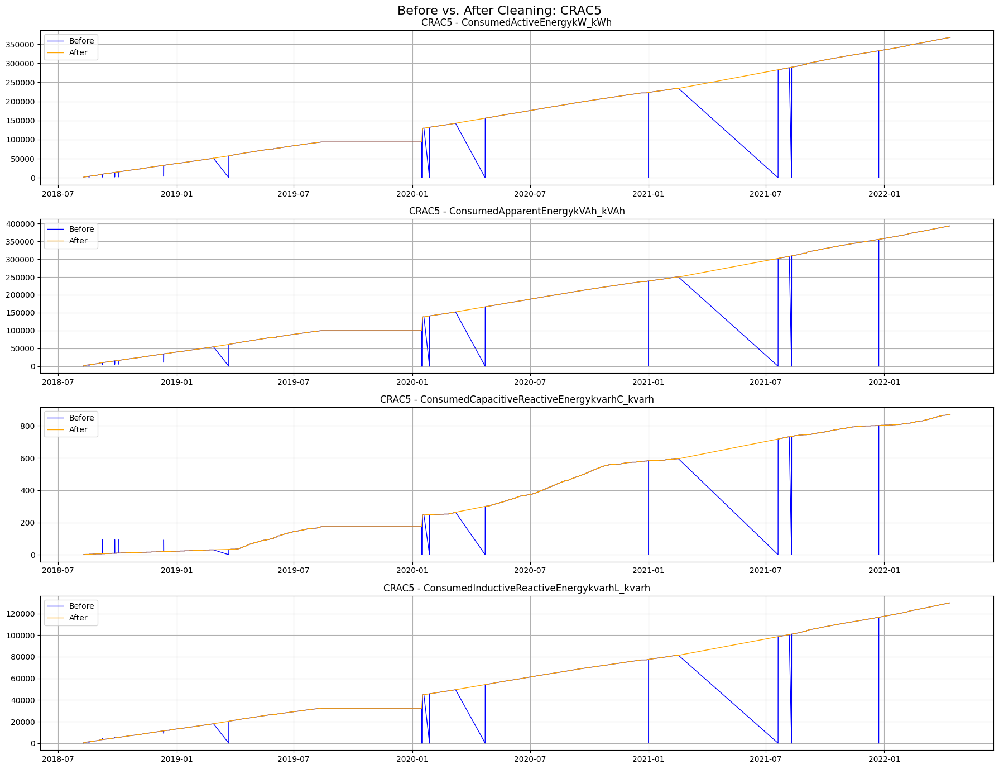

Generating plot for CRAC6...


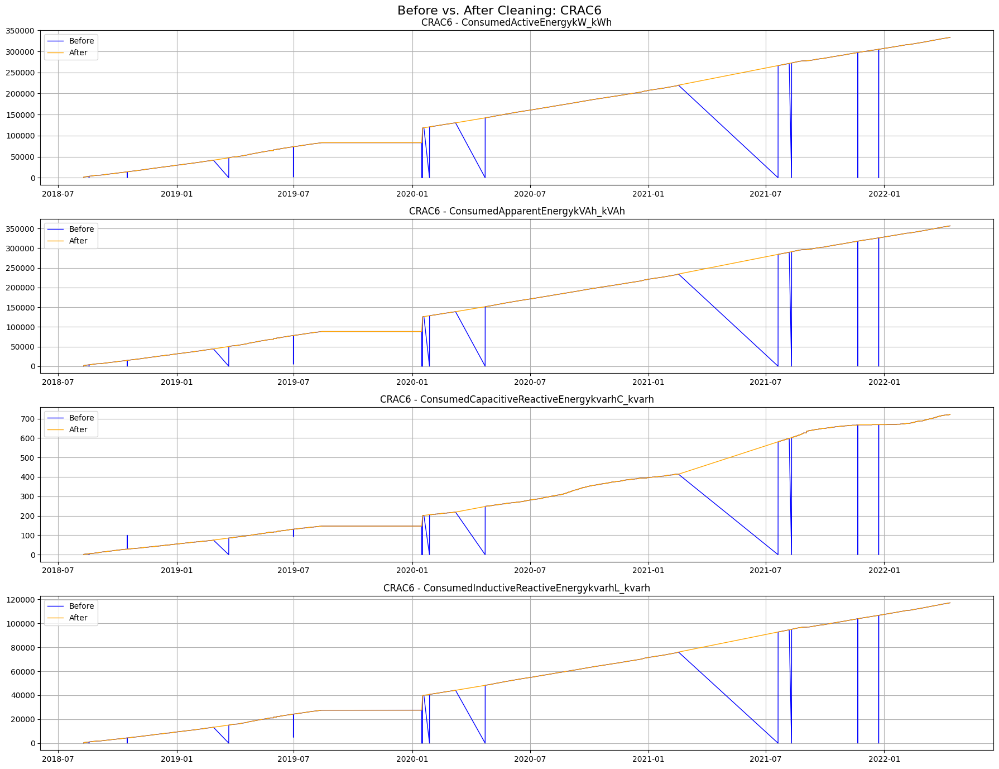

Generating plot for IUDB...


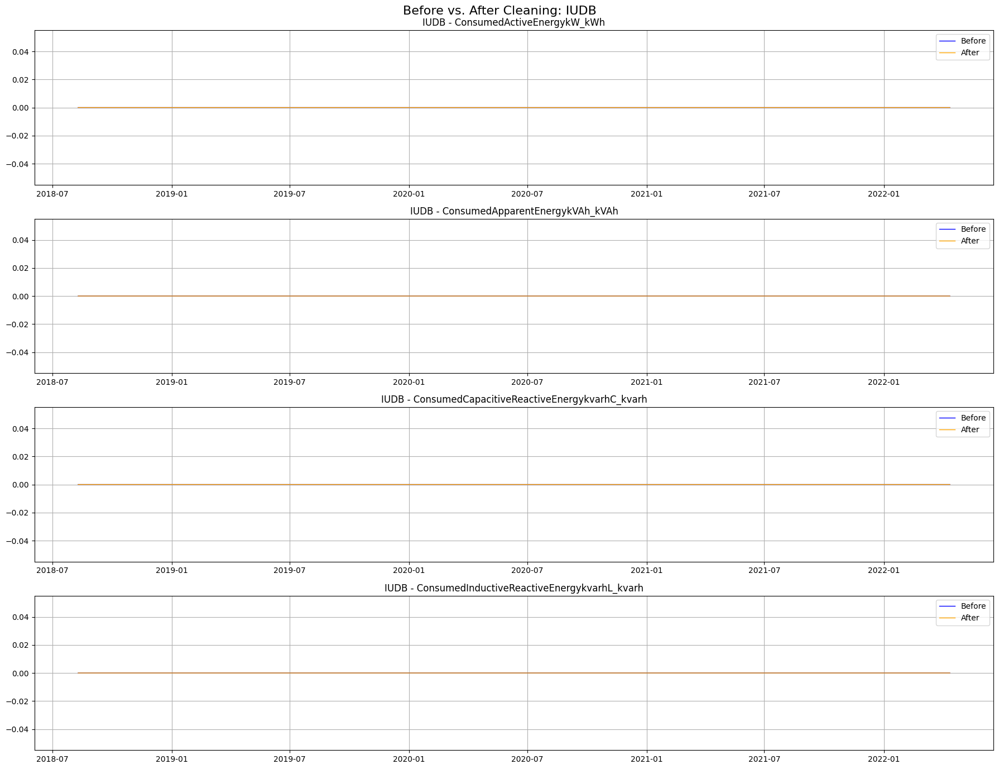

Generating plot for NDB...


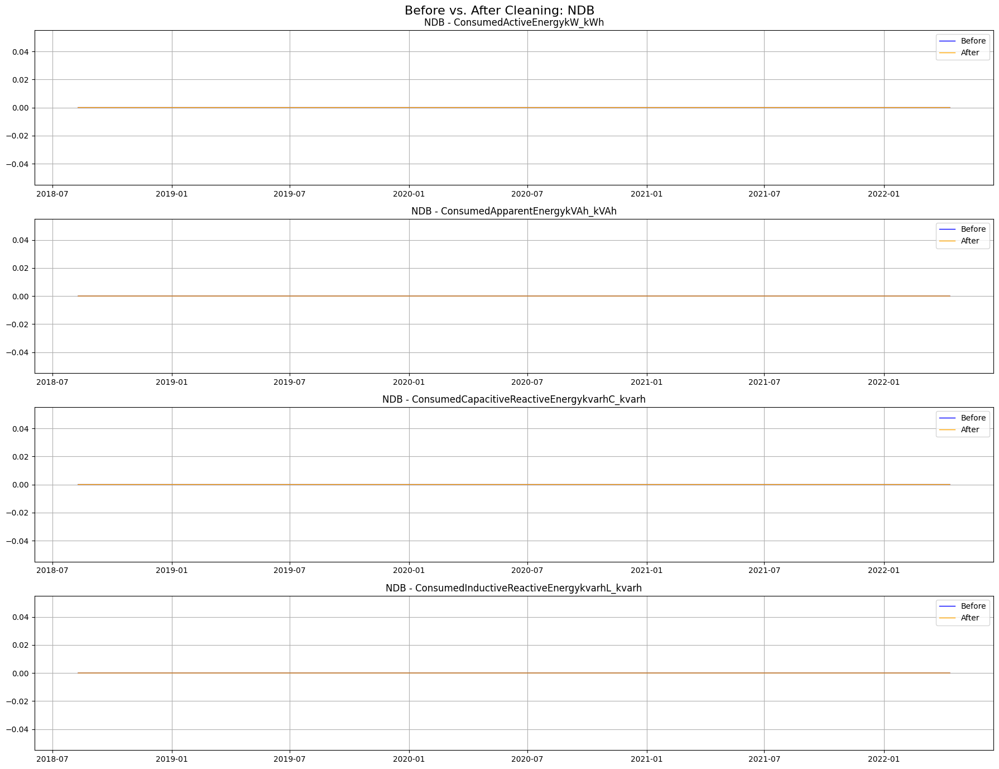

Generating plot for UDB1...


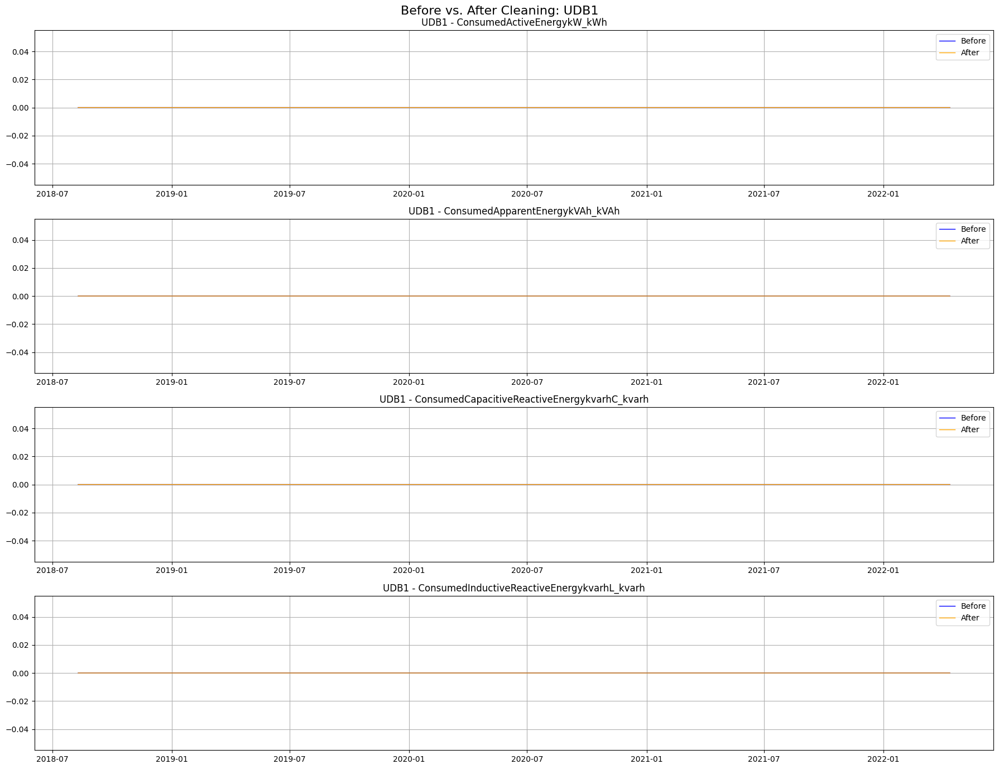

Generating plot for UDB2...


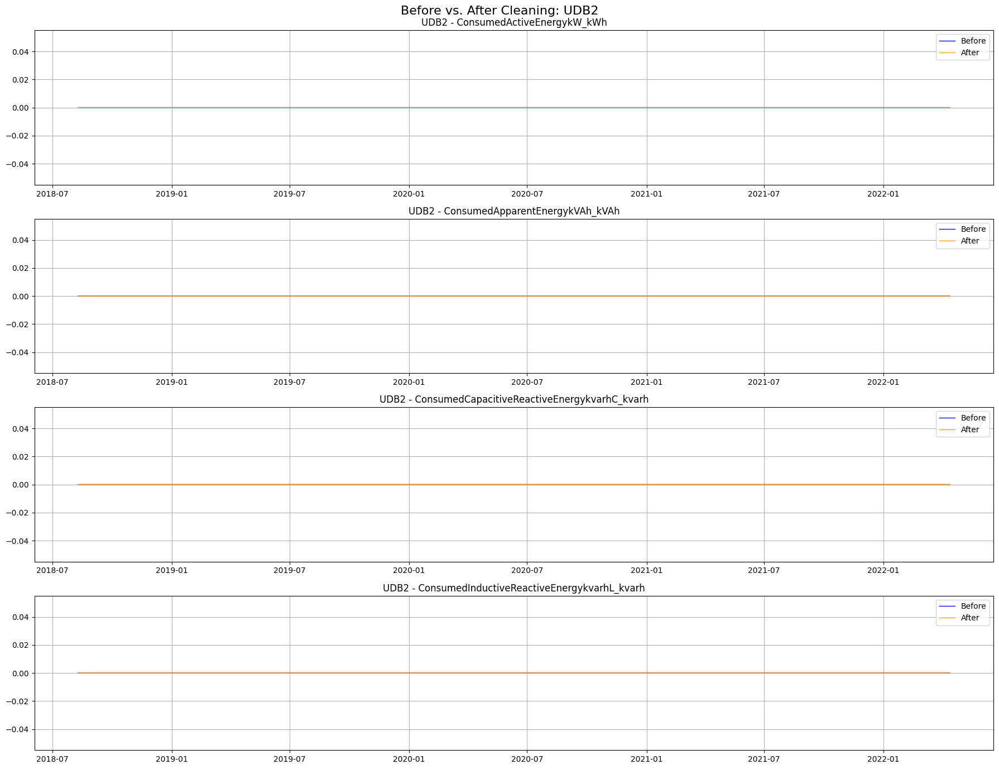

Generating plot for UDB3...


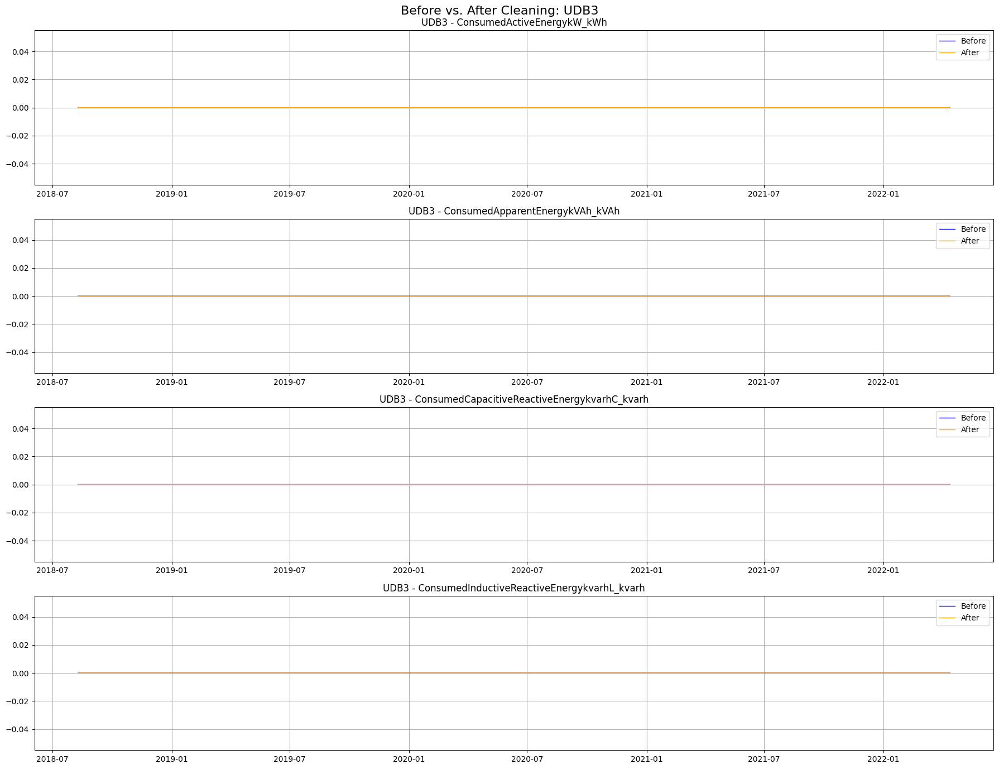

Generating plot for ULC1...


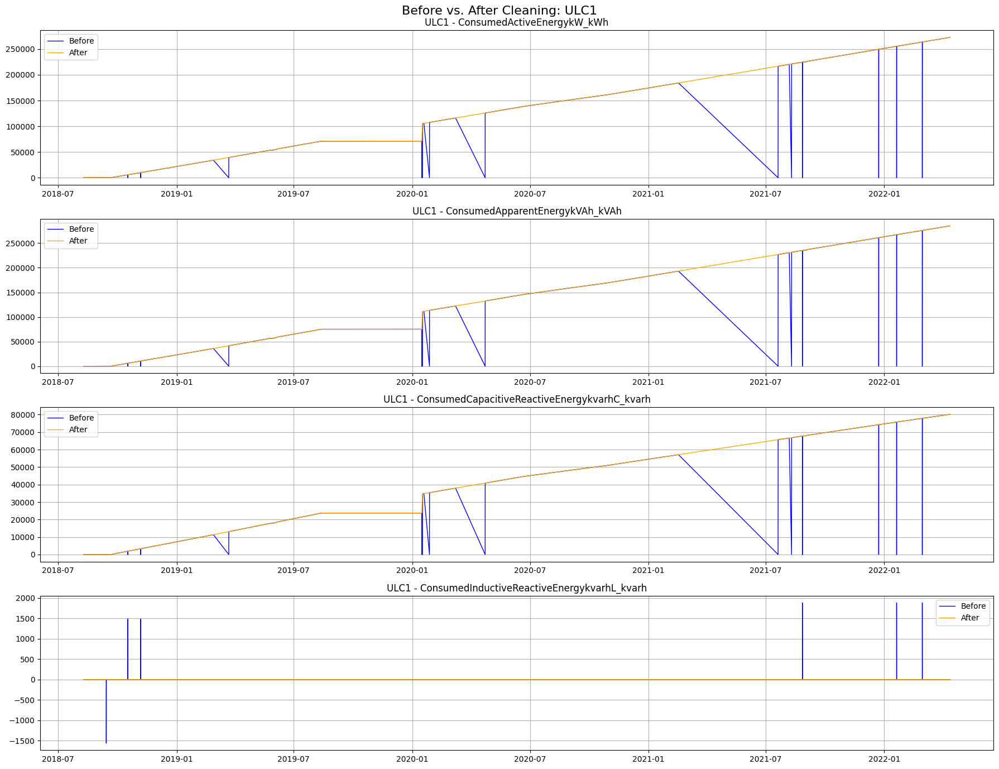

Generating plot for ULC10...


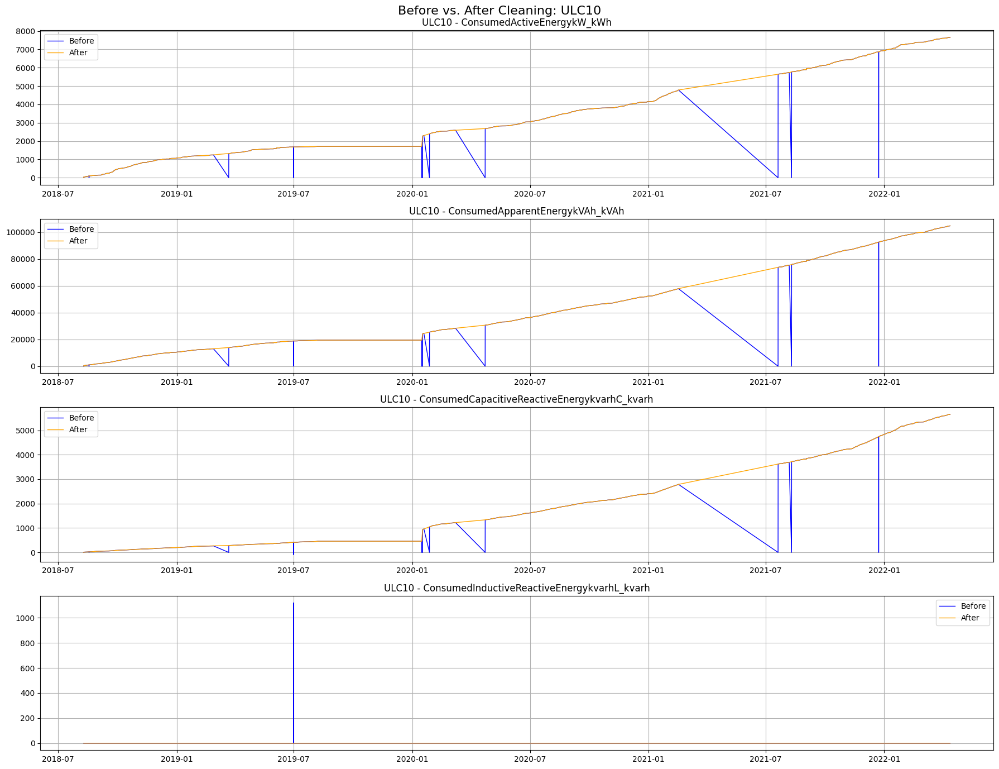

Generating plot for ULC11...


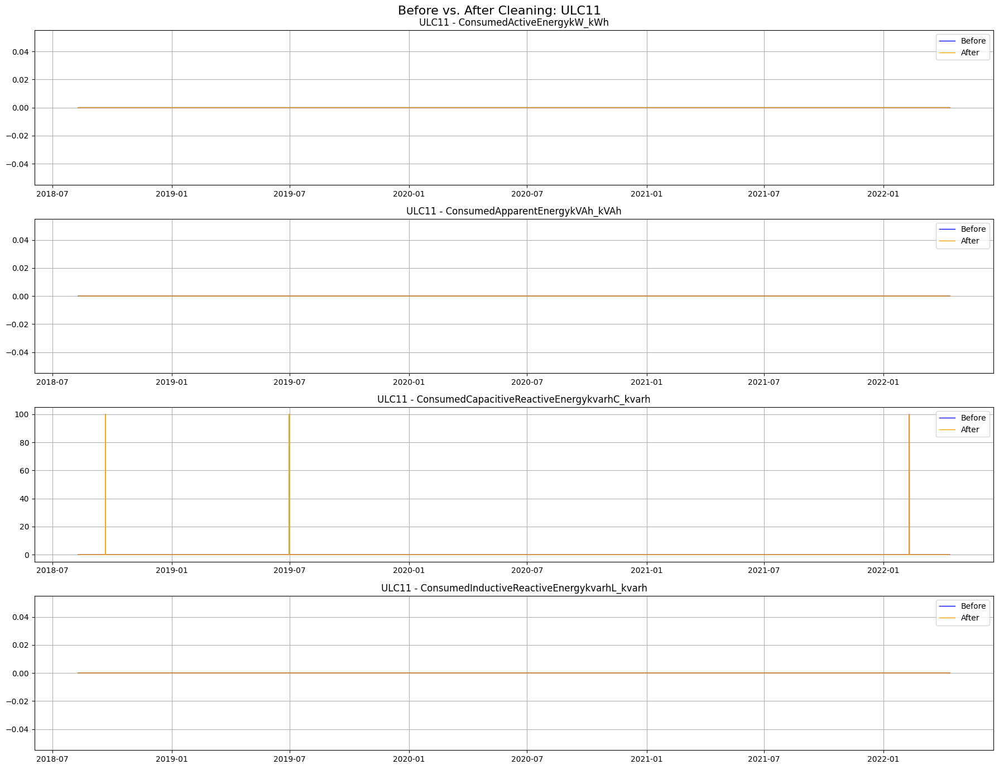

Generating plot for ULC12...


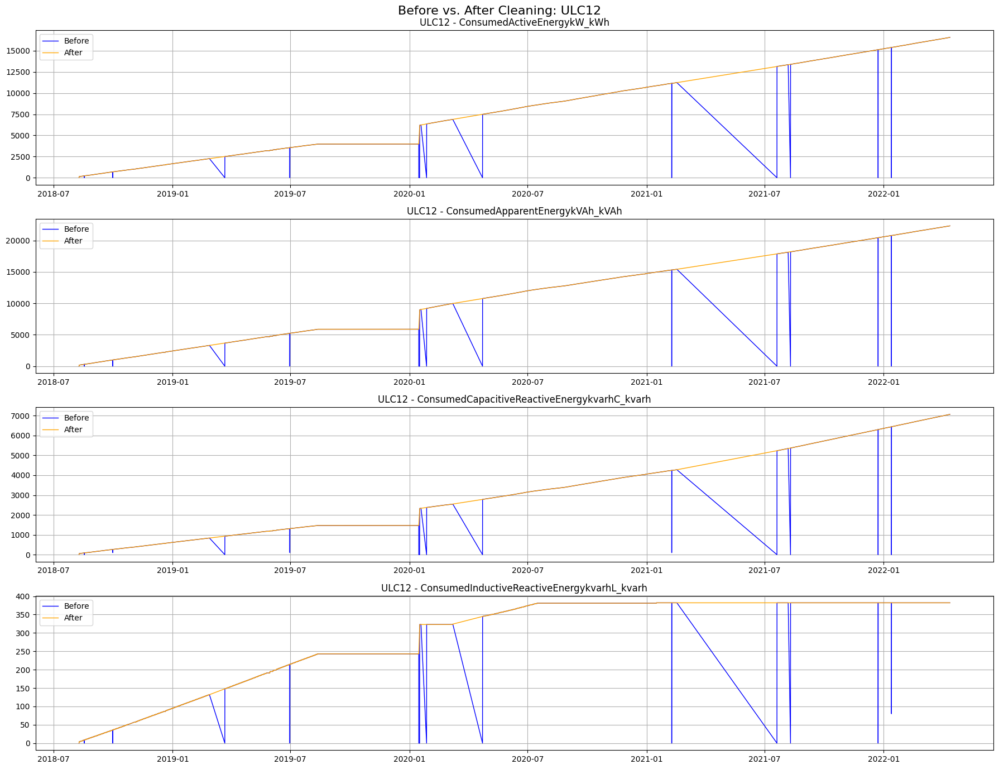

Generating plot for ULC2...


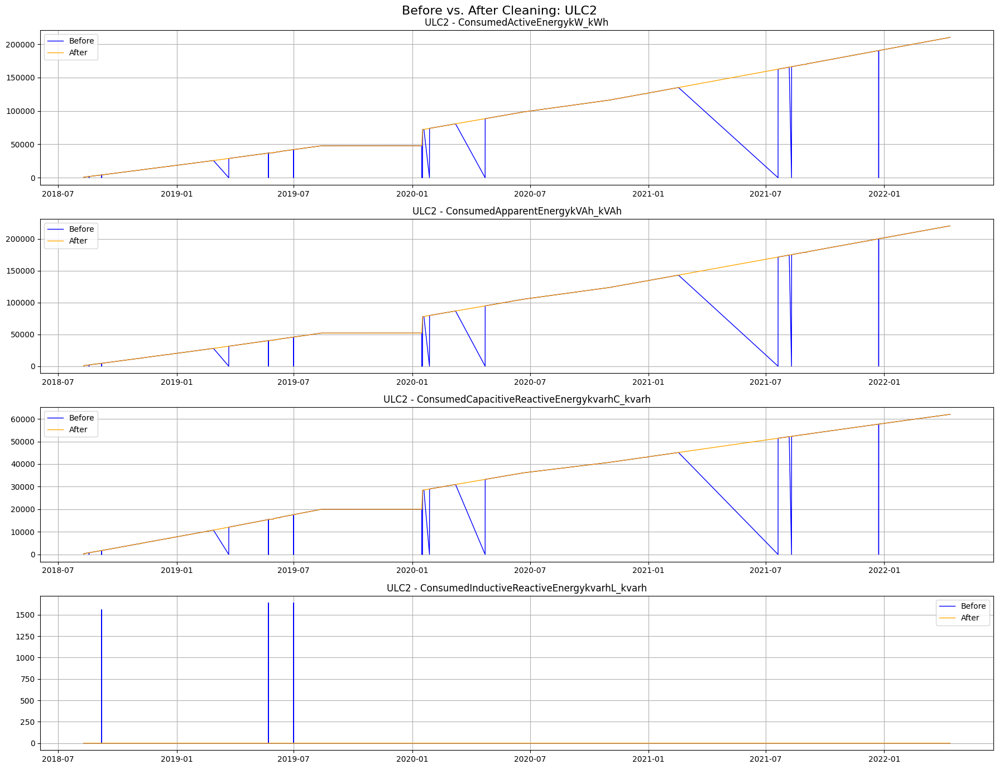

Generating plot for ULC3...


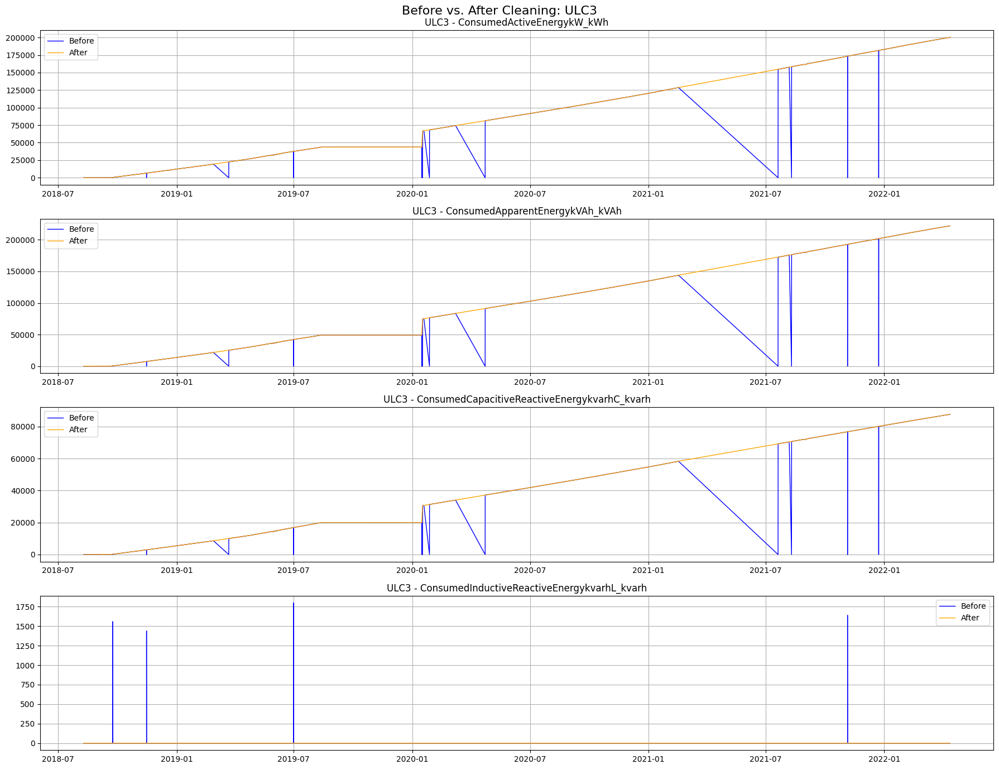

Generating plot for ULC4...


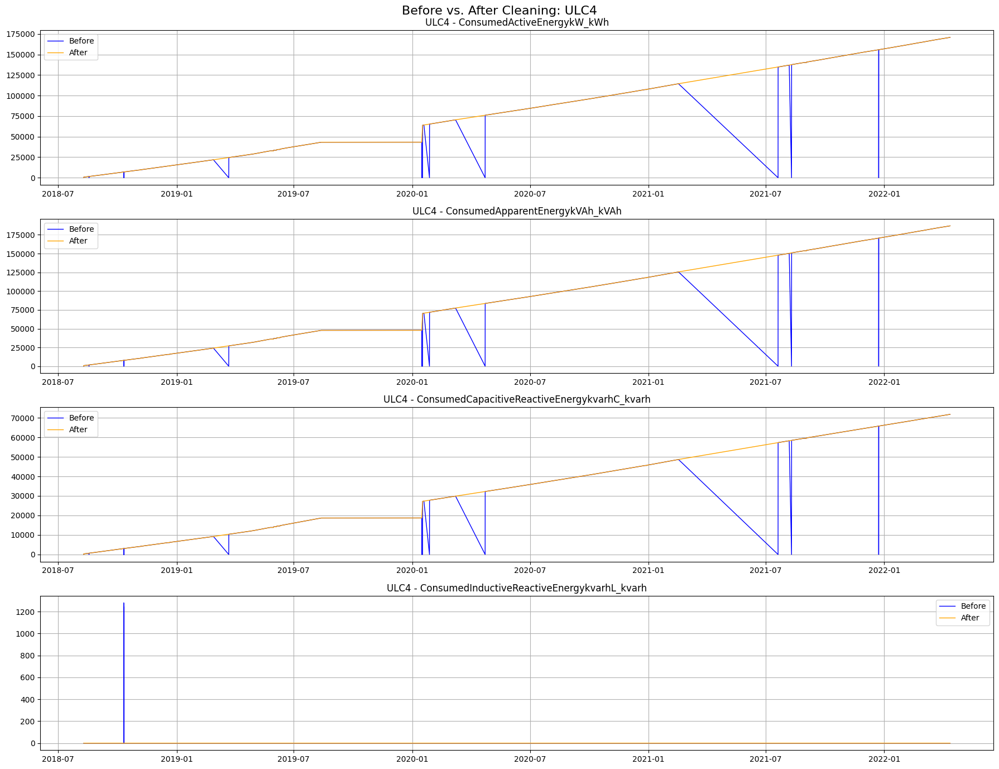

Generating plot for ULC5...


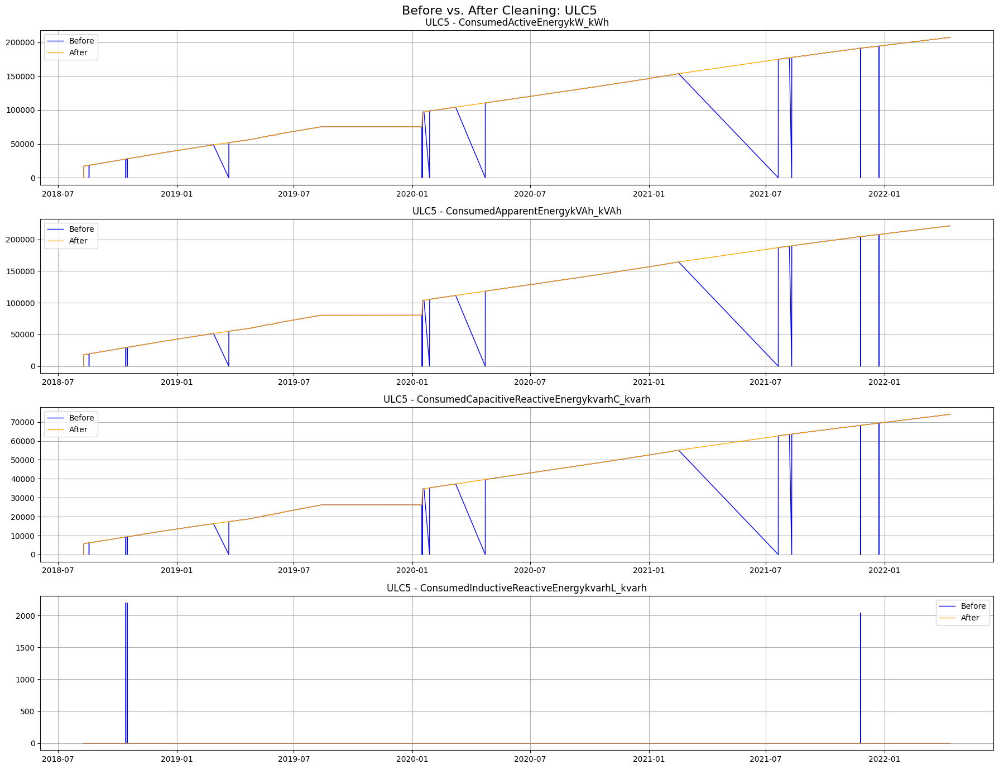

Generating plot for ULC6...


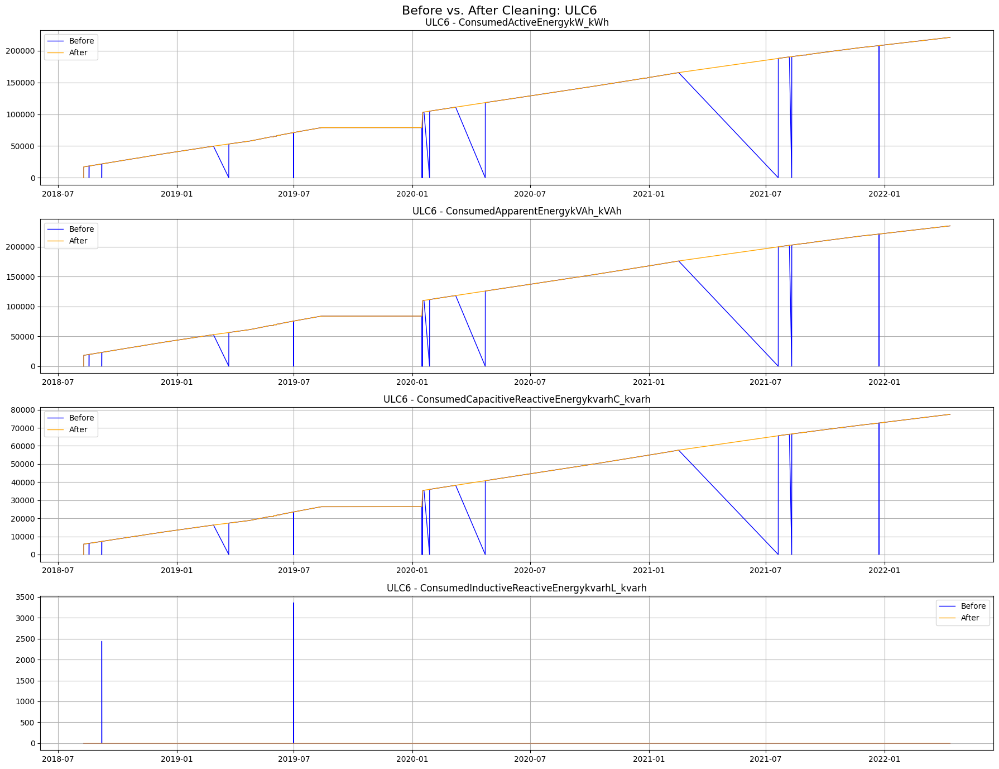

Generating plot for ULC7...


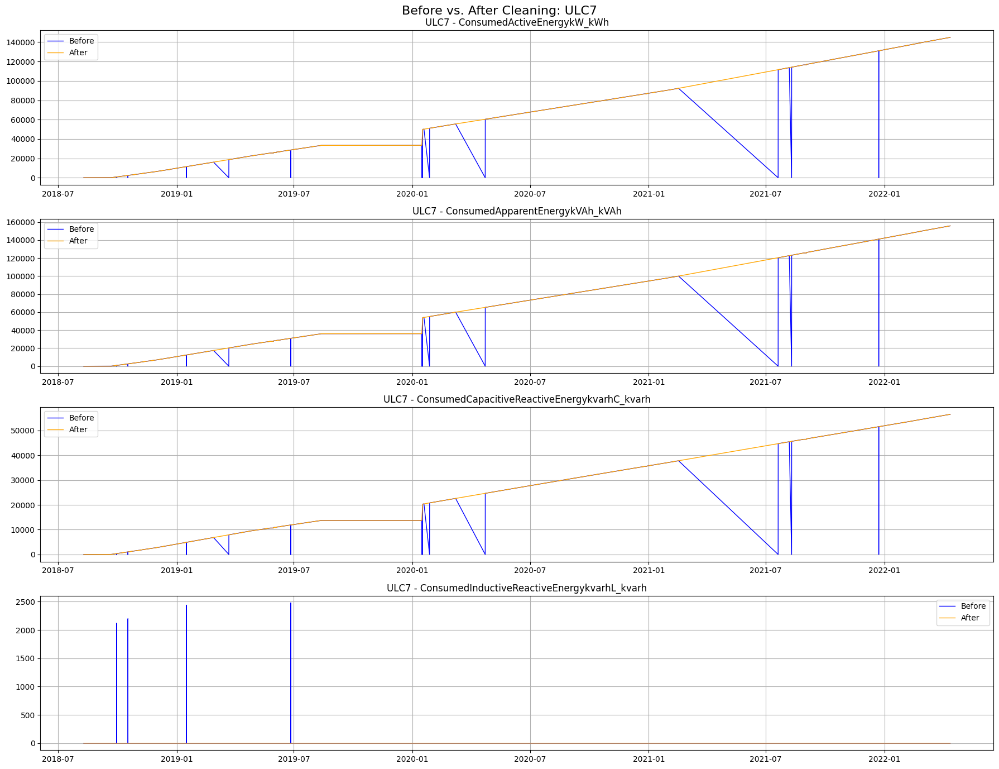

Generating plot for ULC8...


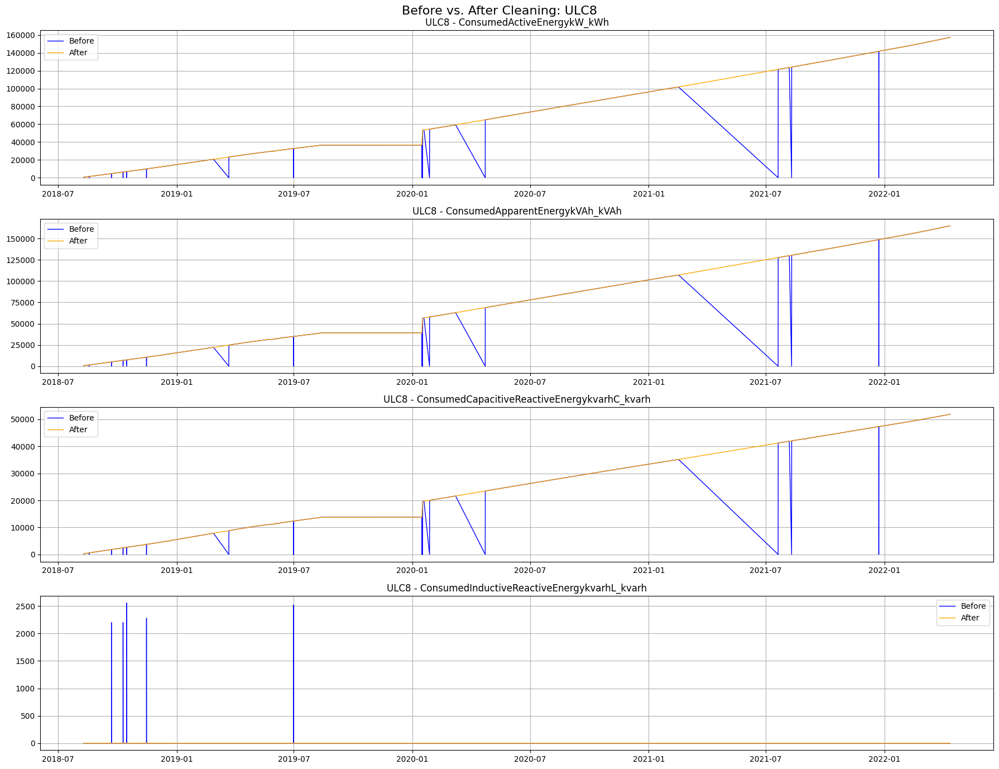

Generating plot for ULC9...


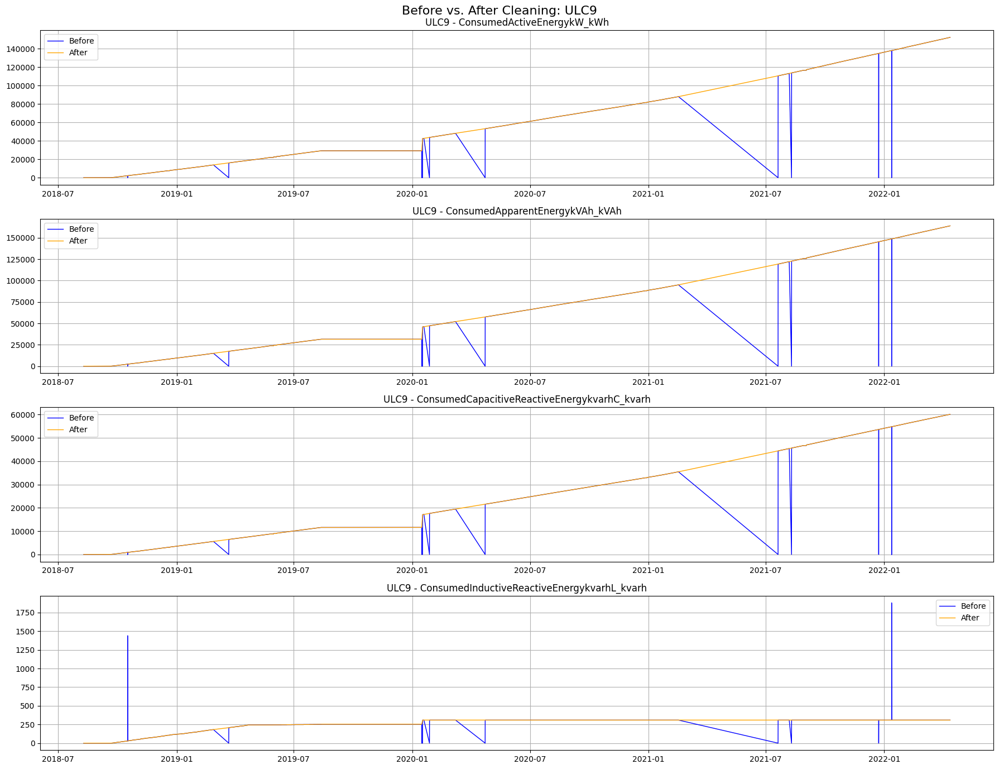

In [39]:
# =============================================================================
# Before vs After Cleaning - All Datasets
# =============================================================================

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------------------------------------------------------
# Directories
# -----------------------------------------------------------------------------

PROCESSING_DIR = Path("..").resolve()
BEFORE_DIR = PROCESSING_DIR / "parquet_aligned"
AFTER_DIR = PROCESSING_DIR / "parquet_cleaned"

# -----------------------------------------------------------------------------
# Cumulative Counter Metrics
# -----------------------------------------------------------------------------

CUMULATIVE_COUNTER_METRICS = [
    "ConsumedActiveEnergykW_kWh",
    "ConsumedApparentEnergykVAh_kVAh",
    "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
    "ConsumedInductiveReactiveEnergykvarhL_kvarh",
]

# -----------------------------------------------------------------------------
# Plotting Loop
# -----------------------------------------------------------------------------

for file in sorted(BEFORE_DIR.glob("*.parquet")):

    device = file.stem.upper()
    after_file = AFTER_DIR / file.name

    if not after_file.exists():
        print(f"Skipping {device} (cleaned file not found in {AFTER_DIR})")
        continue

    print(f"Generating plot for {device}...")

    before = pd.read_parquet(file)
    after = pd.read_parquet(after_file)

    fig, axes = plt.subplots(
        nrows=len(CUMULATIVE_COUNTER_METRICS),
        ncols=1,
        figsize=(18, 14),
        sharex=False
    )

    for ax, metric in zip(axes, CUMULATIVE_COUNTER_METRICS):

        if metric in before.columns:
            ax.plot(
                before.index,
                before[metric],
                label="Before",
                linewidth=1.0,
                color="blue"
            )

        if metric in after.columns:
            ax.plot(
                after.index,
                after[metric],
                label="After",
                linewidth=1.0,
                color="orange"
            )

        ax.set_title(f"{device} - {metric}")
        ax.grid(True)
        ax.legend()

    plt.suptitle(f"Before vs. After Cleaning: {device}", fontsize=16)
    plt.tight_layout()

    # Save figure to disk before showing
    #plot_path = PLOT_DIR / f"{device}_before_after.png"
    #plt.savefig(plot_path, dpi=150)
    plt.show()
    plt.close(fig)

#print(f"\nAll plots saved to:\n{PLOT_DIR}")

In [40]:
# =============================================================================
# Verify Monotonicity of Cleaned Counter Metrics
# =============================================================================

from pathlib import Path
import pandas as pd

# -----------------------------------------------------------------------------
# Directories & Metrics
# -----------------------------------------------------------------------------

PROCESSING_DIR = Path("..").resolve()
CLEANED_DIR = PROCESSING_DIR / "parquet_cleaned"

CUMULATIVE_COUNTER_METRICS = [
    "ConsumedActiveEnergykW_kWh",
    "ConsumedApparentEnergykVAh_kVAh",
    "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
    "ConsumedInductiveReactiveEnergykvarhL_kvarh",
]

# -----------------------------------------------------------------------------
# Verification Loop
# -----------------------------------------------------------------------------

verification_results = []

for file in sorted(CLEANED_DIR.glob("*.parquet")):
    device = file.stem.upper()
    df = pd.read_parquet(file)
    
    device_passed = True

    for metric in CUMULATIVE_COUNTER_METRICS:
        if metric not in df.columns:
            continue

        # Skip metrics that are almost entirely zeros
        if (df[metric] == 0).mean() > 0.99:
            continue

        # Calculate differences between consecutive rows
        diffs = df[metric].diff()
        negative_diffs = diffs[diffs < 0]
        num_decreases = len(negative_diffs)

        if num_decreases > 0:
            device_passed = False
            max_drop = negative_diffs.min()
            
            verification_results.append({
                "Device": device,
                "Metric": metric,
                "Decreases Found": num_decreases,
                "Max Drop Size": max_drop,
                "Status": "FAIL"
            })

    if device_passed:
        verification_results.append({
            "Device": device,
            "Metric": "All Active Metrics",
            "Decreases Found": 0,
            "Max Drop Size": 0.0,
            "Status": "PASS"
        })

# -----------------------------------------------------------------------------
# Report
# -----------------------------------------------------------------------------

results_df = pd.DataFrame(verification_results)

# Display summary table
display(results_df)

total_failures = len(results_df[results_df["Status"] == "FAIL"])
if total_failures == 0:
    print("\n✅ SUCCESS: All active cumulative counters are strictly non-decreasing!")
else:
    print(f"\n⚠️ WARNING: Found lingering drops in {total_failures} metric(s).")

,Device,Metric,Decreases Found,Max Drop Size,Status
0,ADB,All Active Metrics,0,0.0,PASS
1,CRAC1,All Active Metrics,0,0.0,PASS
2,CRAC2,All Active Metrics,0,0.0,PASS
3,CRAC3,All Active Metrics,0,0.0,PASS
4,CRAC4,All Active Metrics,0,0.0,PASS
5,CRAC5,All Active Metrics,0,0.0,PASS
6,CRAC6,All Active Metrics,0,0.0,PASS
7,IUDB,All Active Metrics,0,0.0,PASS
8,NDB,All Active Metrics,0,0.0,PASS
9,UDB1,All Active Metrics,0,0.0,PASS



⚠️ WARNING: Found lingering drops in 1 metric(s).


In [42]:
# =============================================================================
# Standalone ULC3 Cleaning Script (Targeted Spike & Drop Removal)
# =============================================================================

from pathlib import Path
import pandas as pd

# -----------------------------------------------------------------------------
# Paths & Settings
# -----------------------------------------------------------------------------

PROCESSING_DIR = Path("..").resolve()
INPUT_FILE = PROCESSING_DIR / "parquet_aligned" / "ulc3.parquet"
OUTPUT_FILE = PROCESSING_DIR / "parquet_cleaned" / "ulc3.parquet"

CUMULATIVE_COUNTER_METRICS = [
    "ConsumedActiveEnergykW_kWh",
    "ConsumedApparentEnergykVAh_kVAh",
    "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
    "ConsumedInductiveReactiveEnergykvarhL_kvarh",
]

# -----------------------------------------------------------------------------
# targeted Cleaning for ULC3
# -----------------------------------------------------------------------------

print("Processing ULC3 specifically...")
df = pd.read_parquet(INPUT_FILE)
original_rows = len(df)
total_removed = 0

for pass_num in range(1, 10):
    remove_mask = pd.Series(False, index=df.index)

    for metric in CUMULATIVE_COUNTER_METRICS:
        if metric not in df.columns:
            continue

        if (df[metric] == 0).mean() > 0.99:
            continue

        series = df[metric]
        
        # 1. Flag negative step drops (current < previous)
        is_drop = series.diff() < 0
        
        # 2. Flag single-point upward spikes (prev < current > next)
        prev_val = series.shift(1)
        next_val = series.shift(-1)
        is_spike = (series > prev_val) & (series > next_val)

        remove_mask |= is_drop | is_spike

    n_to_remove = int(remove_mask.sum())
    
    if n_to_remove == 0:
        print(f"ULC3 fully cleaned in {pass_num - 1} pass(es).")
        break

    total_removed += n_to_remove
    df = df.loc[~remove_mask].copy()

# Save updated cleaned file
df.to_parquet(OUTPUT_FILE, index=True, compression="snappy")

print(f"\n--- ULC3 Summary ---")
print(f"Original Rows : {original_rows}")
print(f"Rows Removed  : {total_removed}")
print(f"Remaining Rows : {len(df)}")
print(f"Saved to      : {OUTPUT_FILE}")

# -----------------------------------------------------------------------------
# Instant Verification Check
# -----------------------------------------------------------------------------

metric_to_check = "ConsumedCapacitiveReactiveEnergykvarhC_kvarh"
remaining_drops = (df[metric_to_check].diff() < 0).sum()

if remaining_drops == 0:
    print(f"\n✅ VERIFIED: '{metric_to_check}' now has 0 decreases. Status: PASS")
else:
    print(f"\n⚠️ WARNING: Still found {remaining_drops} decrease(s).")

Processing ULC3 specifically...
ULC3 fully cleaned in 3 pass(es).

--- ULC3 Summary ---
Original Rows : 1570707
Rows Removed  : 20
Remaining Rows : 1570687
Saved to      : C:\Users\35387\OneDrive\Desktop\Publishing\energy-data\energydata-master\energydata-master\processing\parquet_cleaned\ulc3.parquet

✅ VERIFIED: 'ConsumedCapacitiveReactiveEnergykvarhC_kvarh' now has 0 decreases. Status: PASS


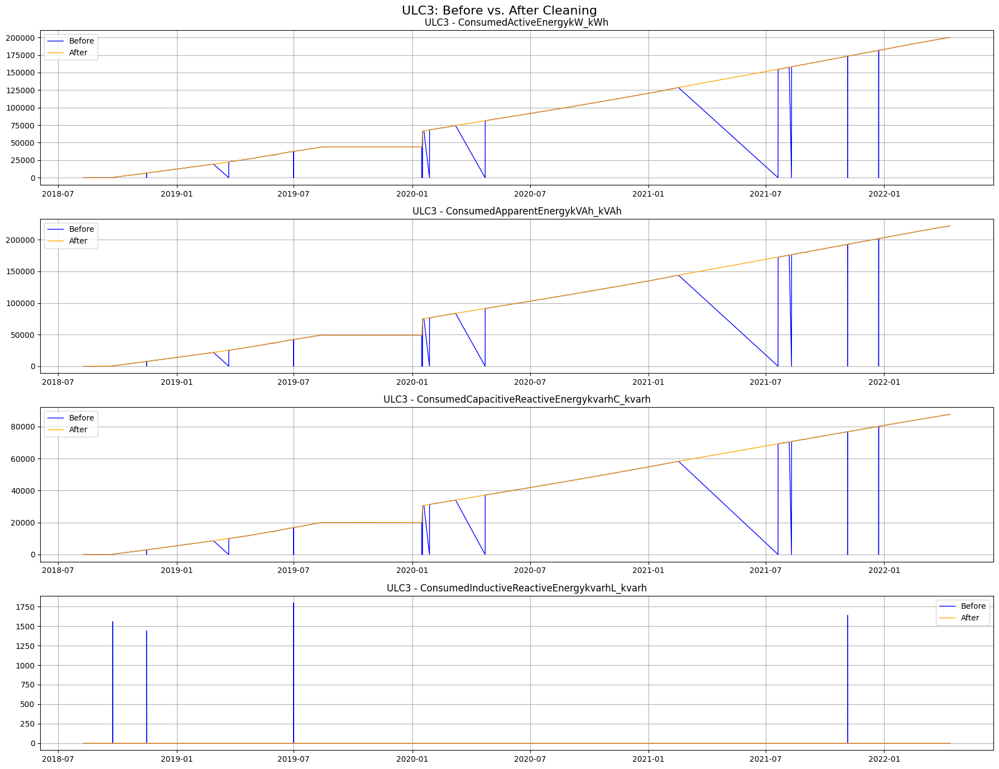

In [44]:
# =============================================================================
# ULC3 - Before vs After Cleaning Plot
# =============================================================================

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------------------------------------------------------
# Paths
# -----------------------------------------------------------------------------

PROCESSING_DIR = Path("..").resolve()
BEFORE_FILE = PROCESSING_DIR / "parquet_aligned" / "ulc3.parquet"
AFTER_FILE = PROCESSING_DIR / "parquet_cleaned" / "ulc3.parquet"

CUMULATIVE_COUNTER_METRICS = [
    "ConsumedActiveEnergykW_kWh",
    "ConsumedApparentEnergykVAh_kVAh",
    "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
    "ConsumedInductiveReactiveEnergykvarhL_kvarh",
]

# -----------------------------------------------------------------------------
# Load & Plot
# -----------------------------------------------------------------------------

before = pd.read_parquet(BEFORE_FILE)
after = pd.read_parquet(AFTER_FILE)

fig, axes = plt.subplots(
    nrows=4,
    ncols=1,
    figsize=(18, 14),
    sharex=False
)

for ax, metric in zip(axes, CUMULATIVE_COUNTER_METRICS):

    if metric in before.columns:
        ax.plot(
            before.index,
            before[metric],
            label="Before",
            linewidth=1.0,
            color="blue"
        )

    if metric in after.columns:
        ax.plot(
            after.index,
            after[metric],
            label="After",
            linewidth=1.0,
            color="orange"
        )

    ax.set_title(f"ULC3 - {metric}")
    ax.grid(True)
    ax.legend()

plt.suptitle("ULC3: Before vs. After Cleaning", fontsize=16)
plt.tight_layout()
plt.show()

## Check:

In [45]:
# =============================================================================
# Compare Row Counts: Aligned vs. Cleaned Datasets
# =============================================================================

from pathlib import Path
import pandas as pd

# -----------------------------------------------------------------------------
# Directories
# -----------------------------------------------------------------------------

PROCESSING_DIR = Path("..").resolve()
BEFORE_DIR = PROCESSING_DIR / "parquet_aligned"
AFTER_DIR = PROCESSING_DIR / "parquet_cleaned"

# -----------------------------------------------------------------------------
# Comparison Loop
# -----------------------------------------------------------------------------

row_comparison = []

for file in sorted(AFTER_DIR.glob("*.parquet")):
    device = file.stem.upper()
    
    # Path to original aligned file
    before_file = BEFORE_DIR / file.name
    
    # Load row counts efficiently
    df_after = pd.read_parquet(file)
    rows_after = len(df_after)
    
    if before_file.exists():
        df_before = pd.read_parquet(before_file)
        rows_before = len(df_before)
    else:
        rows_before = None

    rows_removed = (rows_before - rows_after) if rows_before is not None else 0
    pct_removed = (rows_removed / rows_before * 100) if rows_before else 0.0

    row_comparison.append({
        "Device": device,
        "Original Rows": rows_before,
        "Cleaned Rows": rows_after,
        "Rows Removed": rows_removed,
        "% Removed": f"{pct_removed:.4f}%"
    })

# -----------------------------------------------------------------------------
# Display Summary DataFrame
# -----------------------------------------------------------------------------

comparison_df = pd.DataFrame(row_comparison)

# Display formatted table
display(comparison_df)

# Print totals summary
total_orig = comparison_df["Original Rows"].sum()
total_clean = comparison_df["Cleaned Rows"].sum()
total_removed = comparison_df["Rows Removed"].sum()

print("\n--- Overall Dataset Summary ---")
print(f"Total Original Rows : {total_orig:,}")
print(f"Total Cleaned Rows  : {total_clean:,}")
print(f"Total Rows Removed  : {total_removed:,} ({(total_removed / total_orig * 100):.4f}% of total data)")

,Device,Original Rows,Cleaned Rows,Rows Removed,% Removed
0,ADB,1570251,1570251,0,0.0000%
1,CRAC1,1570230,1570217,13,0.0008%
2,CRAC2,1570716,1570692,24,0.0015%
3,CRAC3,1570202,1570185,17,0.0011%
4,CRAC4,1570221,1570203,18,0.0011%
5,CRAC5,1570707,1570686,21,0.0013%
6,CRAC6,1570707,1570691,16,0.0010%
7,IUDB,1570220,1570220,0,0.0000%
8,NDB,1570241,1570241,0,0.0000%
9,UDB1,1570724,1570724,0,0.0000%



--- Overall Dataset Summary ---
Total Original Rows : 37,693,128
Total Cleaned Rows  : 37,692,852
Total Rows Removed  : 276 (0.0007% of total data)


In [46]:
# =============================================================================
# Check Start and End Timestamps for Cleaned Datasets
# =============================================================================

from pathlib import Path
import pandas as pd

# -----------------------------------------------------------------------------
# Directories & Check Loop
# -----------------------------------------------------------------------------

CLEANED_DIR = Path("..").resolve() / "parquet_cleaned"

time_bounds = []

for file in sorted(CLEANED_DIR.glob("*.parquet")):
    device = file.stem.upper()
    df = pd.read_parquet(file)

    start_time = df.index.min()
    end_time = df.index.max()
    duration = end_time - start_time

    time_bounds.append({
        "Device": device,
        "Start Time": start_time,
        "End Time": end_time,
        "Duration": duration
    })

# -----------------------------------------------------------------------------
# Summary Table
# -----------------------------------------------------------------------------

bounds_df = pd.DataFrame(time_bounds)
display(bounds_df)

,Device,Start Time,End Time,Duration
0,ADB,2018-08-09 15:49:22,2022-04-12 15:48:05,1341 days 23:58:43
1,CRAC1,2018-08-09 15:49:22,2022-04-12 15:53:05,1342 days 00:03:43
2,CRAC2,2018-08-09 15:49:22,2022-04-12 23:59:05,1342 days 08:09:43
3,CRAC3,2018-08-09 15:49:22,2022-04-12 15:27:05,1341 days 23:37:43
4,CRAC4,2018-08-09 15:49:22,2022-04-12 15:52:05,1342 days 00:02:43
5,CRAC5,2018-08-09 15:49:22,2022-04-12 23:59:05,1342 days 08:09:43
6,CRAC6,2018-08-09 15:49:22,2022-04-12 23:59:05,1342 days 08:09:43
7,IUDB,2018-08-09 15:49:22,2022-04-12 15:43:05,1341 days 23:53:43
8,NDB,2018-08-09 15:49:22,2022-04-12 15:53:05,1342 days 00:03:43
9,UDB1,2018-08-09 15:49:22,2022-04-12 23:59:05,1342 days 08:09:43


## Results:

- Removal of anomalous cumulative counter reset observations affected only 10–20 timestamps per active device (<0.002% of observations). 
- The overall temporal coverage of the benchmark dataset remained unchanged, with only minute-level reductions in the end timestamps for a small number of devices due to the removal of final reset observations.